# Code 1 - Original

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from google.colab import drive
from skimage.util import random_noise # Diperlukan untuk augmentasi noise (jika digunakan)

In [ ]:
def preprocess_image(image_path):
    """
    Memuat gambar, mengubahnya menjadi grayscale, dan mengurangi noise.

    Args:
        image_path (str): Jalur lengkap ke file gambar.

    Returns:
        tuple: Mengembalikan tuple berisi:
            - original_image (numpy.ndarray): Gambar asli dalam mode warna.
            - blurred (numpy.ndarray): Gambar grayscale setelah Gaussian Blur.

    Raises:
        FileNotFoundError: Jika gambar tidak ditemukan di jalur yang diberikan.
    """
    # Membaca gambar dalam mode warna
    original_image = cv2.imread(image_path)
    if original_image is None:
        raise FileNotFoundError(f"Gambar tidak ditemukan di path: {image_path}")

    # Konversi ke grayscale
    gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

    # Mengurangi noise dengan Gaussian Blur
    # Kernel (5,5) adalah ukuran yang baik untuk dimulai
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)

    return original_image, blurred

In [ ]:
def augment_image(image, max_angle=5, brightness_factor=None, contrast_factor=None, noise_type=None, noise_amount=0.01, crop_amount=0):
    """
    Menerapkan augmentasi pada gambar.

    Args:
        image (numpy.ndarray): Gambar input (dalam format BGR atau grayscale).
        max_angle (int): Sudut maksimum (dalam derajat) untuk rotasi acak. Default 5.
        brightness_factor (float, optional): Faktor untuk menyesuaikan kecerahan (misal: 0.5 untuk lebih gelap, 1.5 untuk lebih terang). Jika None, kecerahan tidak diubah.
        contrast_factor (float, optional): Faktor untuk menyesuaikan kontras (misal: 0.5 untuk kontras rendah, 1.5 untuk kontras tinggi). Jika None, kontras tidak diubah.
        noise_type (str, optional): Tipe noise yang akan ditambahkan ('salt', 'pepper', 'gaussian', 'speckle'). Jika None, noise tidak ditambahkan. Noise removal akan dilakukan setelahnya.
        noise_amount (float): Jumlah noise untuk ditambahkan. Default 0.01.
        crop_amount (float): Persentase maksimum (0-1) untuk memotong gambar secara acak dari setiap sisi. Default 0 (tidak ada pemotongan).

    Returns:
        numpy.ndarray: Gambar yang telah diaugmentasi.
    """
    augmented_image = image.copy()
    height, width = augmented_image.shape[:2]

    # 1. Rotasi Acak Kecil
    if max_angle > 0:
        angle = random.uniform(-max_angle, max_angle)
        # Dapatkan matriks rotasi
        rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), angle, 1)
        # Lakukan rotasi
        augmented_image = cv2.warpAffine(augmented_image, rotation_matrix, (width, height),
                                         borderMode=cv2.BORDER_REPLICATE) # Isi area kosong dengan mereplikasi piksel tepi


    # 2. Penyesuaian Kecerahan dan Kontras
    # Menggunakan operasi piksel: g(x) = alpha * f(x) + beta
    # Kontras dikontrol oleh alpha (contrast_factor), Kecerahan oleh beta (brightness_factor)
    if brightness_factor is not None or contrast_factor is not None:
         # Konversi ke tipe data float agar operasi aritmatika tidak terpotong
        if augmented_image.dtype == np.uint8:
             augmented_image = augmented_image.astype(np.float32)

        if contrast_factor is not None:
            augmented_image = augmented_image * contrast_factor
        if brightness_factor is not None:
             # Tambahkan kecerahan (beta), pastikan dalam rentang 0-255 jika aslinya uint8
             # Jika input aslinya uint8, skalakan brightness_factor agar sesuai
            if image.dtype == np.uint8:
                 augmented_image = augmented_image + (brightness_factor - 1) * 255 # Sesuaikan offset untuk uint8
            else:
                 augmented_image = augmented_image + (brightness_factor - 1)


        # Pastikan nilai piksel berada dalam rentang yang valid (0-255 for uint8)
        if image.dtype == np.uint8:
            augmented_image = np.clip(augmented_image, 0, 255).astype(np.uint8)
        else:
             augmented_image = np.clip(augmented_image, 0, 1) # Asumsikan float antara 0 dan 1 jika bukan uint8


    # 3. Tambahkan Noise (Opsional, untuk simulasi) - Note: User minta penghilangan noise, tapi menambahkan noise kadang juga bagian dari augmentasi
    # Untuk tujuan simulasi atau melatih model agar robust terhadap noise
    if noise_type is not None:
        # scikit-image's random_noise works best on float images [0, 1]
        if augmented_image.dtype == np.uint8:
            augmented_image_float = augmented_image / 255.0
        else:
            augmented_image_float = augmented_image.copy()

        augmented_image_noisy = random_noise(augmented_image_float, mode=noise_type, amount=noise_amount)

        # Convert back to original data type range
        if image.dtype == np.uint8:
            augmented_image = (augmented_image_noisy * 255).astype(np.uint8)
        else:
             augmented_image = augmented_image_noisy


    # 4. Penghilangan Noise (sesuai permintaan user)
    # Menggunakan Gaussian Blur lagi atau metode lain seperti Median Blur
    # Median Blur baik untuk noise salt-and-pepper
    # Gaussian Blur baik untuk noise Gaussian
    # Kita gunakan Median Blur karena seringkali noise pada gambar KLT berupa bintik
    # Ukuran kernel harus ganjil, misal 3 atau 5
    if augmented_image.ndim == 2: # Grayscale
        augmented_image = cv2.medianBlur(augmented_image, 5) # Kernel 5x5
    elif augmented_image.ndim == 3: # Color (aplikasikan ke setiap channel atau konversi ke HSV/Lab)
         # Untuk simplifikasi, kita bisa konversi ke grayscale sementara atau apply ke tiap channel
         # Apply ke tiap channel bisa mengubah warna, konversi ke HSV/Lab lebih baik
         # Mari kita apply median blur ke setiap channel BGR sebagai awal
         # Ini bisa jadi kurang ideal untuk noise tertentu
         channels = cv2.split(augmented_image)
         blurred_channels = []
         for channel in channels:
             blurred_channels.append(cv2.medianBlur(channel, 5))
         augmented_image = cv2.merge(blurred_channels)

    # 5. Cropping Acak
    if crop_amount > 0:
        # Pastikan gambar memiliki dimensi yang cukup untuk cropping
        if height - 2 * int(height * crop_amount) > 0 and width - 2 * int(width * crop_amount) > 0:
            crop_height = int(height * crop_amount)
            crop_width = int(width * crop_amount)

            start_y = random.randint(0, crop_height)
            end_y = height - random.randint(0, crop_height)
            start_x = random.randint(0, crop_width)
            end_x = width - random.randint(0, crop_width)

            # Pastikan koordinat cropping valid
            if start_y < end_y and start_x < end_x:
                 augmented_image = augmented_image[start_y:end_y, start_x:end_x]
            else:
                 print("Peringatan: Cropping menghasilkan area kosong atau terbalik. Cropping dilewati.")
        else:
             print("Peringatan: crop_amount terlalu besar untuk ukuran gambar ini. Cropping dilewati.")

    return augmented_image

In [ ]:
def find_main_lines(image):
    """
    Mendeteksi garis awal (baseline) dan garis akhir (solvent front) secara otomatis.
    """
    # Menghitung jumlah intensitas piksel secara horizontal (sumbu Y)
    # Garis akan menjadi lembah (nilai rendah) dalam profil proyeksi
    horizontal_projection = np.sum(image, axis=1)

    height, width = image.shape

    # Asumsikan baseline berada di 20% bagian bawah gambar
    bottom_part = horizontal_projection[int(height*0.75):]
    baseline_y = np.argmin(bottom_part) + int(height*0.75)

    # Asumsikan solvent front berada di 20% bagian atas gambar
    top_part = horizontal_projection[:int(height*0.05)]
    solvent_front_y = np.argmin(top_part)

    return baseline_y, solvent_front_y

In [ ]:
def find_lanes(image, num_lanes):
    """
    Mendeteksi posisi jalur (lanes) sampel.
    Untuk simplifikasi, kita bagi lebar gambar dengan jumlah jalur.
    Metode yang lebih canggih bisa menggunakan proyeksi vertikal.
    """
    height, width = image.shape
    lane_width = width / num_lanes
    lane_centers_x = [(i * lane_width) + (lane_width / 2) for i in range(num_lanes)]

    return [int(center) for center in lane_centers_x], int(lane_width)

In [ ]:
def analyze_lane_spots(lane_roi, baseline_y, solvent_front_y):
    """
    Mendeteksi noda (spots) dalam satu jalur dan menghitung nilai Rf-nya.
    Menggunakan Adaptive Thresholding untuk mengatasi variasi pencahayaan.
    """
    # Pastikan lane_roi adalah gambar grayscale (1 channel)
    if len(lane_roi.shape) > 2:
        # Konversi ke grayscale jika masih berwarna (meskipun seharusnya sudah grayscale setelah preprocessing)
        lane_roi_gray = cv2.cvtColor(lane_roi, cv2.COLOR_BGR2GRAY)
    else:
        lane_roi_gray = lane_roi

    # Invert gambar: noda gelap menjadi terang
    inverted_roi = cv2.bitwise_not(lane_roi_gray)

    # Terapkan Adaptive Thresholding
    # ADAPTIVE_THRESH_GAUSSIAN_C: threshold adalah rata-rata tertimbang Gaussian dari area tetangga.
    # ADAPTIVE_THRESH_MEAN_C: threshold adalah rata-rata dari area tetangga.
    # BLOCK_SIZE: Ukuran area tetangga yang digunakan. Harus ganjil. Contoh: 11, 15, 21
    # C: Konstanta yang dikurangi dari rata-rata tertimbang Gaussian atau rata-rata.
    # Anda mungkin perlu menyesuaikan BLOCK_SIZE dan C.
    thresh = cv2.adaptiveThreshold(inverted_roi, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY, 21, 0.5) # Block size 15, C=2. Sesuaikan jika perlu.


    # Temukan kontur (bentuk) dari noda
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    detected_spots = []

    total_distance = baseline_y - solvent_front_y

    for cnt in contours:
        # Abaikan kontur yang terlalu kecil (dianggap noise)
        if cv2.contourArea(cnt) > 5: # Sesuaikan nilai 20 ini
            # Hitung pusat massa (centroid) dari noda
            M = cv2.moments(cnt)
            if M["m00"] != 0:
                cY = int(M["m01"] / M["m00"])

                # Hitung jarak noda dari solvent front (karena ROI dipotong dari atas)
                spot_distance = cY

                # Hitung nilai Rf
                # Jarak rambat noda = Jarak total - jarak noda dari baseline
                distance_from_baseline = total_distance - (cY + solvent_front_y - baseline_y)

                # Koreksi: Jarak rambat noda dihitung dari baseline ke pusat noda
                spot_travel_distance = baseline_y - (solvent_front_y + cY)


                if total_distance > 0:
                    rf_value = spot_travel_distance / total_distance
                    if 0 <= rf_value <= 1: # Hanya simpan Rf yang valid
                         detected_spots.append({'y': cY, 'rf': rf_value, 'contour': cnt})


    return detected_spots, thresh # Mengembalikan gambar biner juga

In [ ]:

def main_analysis(image_path, num_lanes):
    """
    Fungsi utama untuk menjalankan seluruh alur analisis.
    """
    try:
        original_image, processed_image = preprocess_image(image_path)
    except FileNotFoundError as e:
        print(e)
        return None # Mengembalikan None jika file tidak ditemukan

    # --- Terapkan Augmentasi setelah Grayscale ---
    # Anda bisa menyesuaikan parameter augmentasi di sini
    augmented_processed_image = augment_image(processed_image,
                                              max_angle=3, # Rotasi acak hingga 3 derajat
                                              brightness_factor=None, # Tidak mengubah kecerahan di sini
                                              contrast_factor=None, # Tidak mengubah kontras di sini
                                              noise_type=None, # Tidak menambahkan noise
                                              crop_amount=0.02) # Potong acak hingga 2% dari setiap sisi


    print(f"\n--- Menganalisis Gambar: {os.path.basename(image_path)} ---")

    # 1. Temukan garis utama (gunakan gambar yang sudah diaugmentasi)
    baseline_y, solvent_front_y = find_main_lines(augmented_processed_image)
    print(f"Garis Awal (Baseline) terdeteksi di y={baseline_y}")
    print(f"Garis Akhir (Solvent Front) terdeteksi di y={solvent_front_y}")

    # 2. Temukan jalur (gunakan gambar yang sudah diaugmentasi)
    lane_centers_x, lane_width = find_lanes(augmented_processed_image, num_lanes)
    print(f"Pusat Jalur terdeteksi di x={lane_centers_x}\n")

    # Siapkan gambar untuk visualisasi hasil (gunakan gambar asli untuk visualisasi overlay)
    result_image = original_image.copy()

    # Gambar garis-garis yang terdeteksi (pada gambar asli, sesuaikan koordinat jika cropping diterapkan)
    # PERHATIAN: Jika cropping diterapkan, koordinat baseline_y dan solvent_front_y
    # perlu disesuaikan kembali ke koordinat gambar asli untuk visualisasi.
    # Untuk simplifikasi saat ini, kita asumsikan cropping tidak signifikan mengubah posisi global garis.
    # Jika cropping aktif, visualisasi garis dan noda mungkin tidak akurat pada gambar asli.
    # Solusi yang lebih baik adalah menggambar pada gambar yang sudah diaugmentasi dan kemudian mengubah ukurannya kembali.
    # Namun, karena kita menggambar di gambar asli, pastikan koordinat sesuai.
    # baseline_y dan solvent_front_y saat ini relatif terhadap augmented_processed_image.
    # Untuk visualisasi, gunakan nilai ini pada gambar asli dengan ukuran yang sama.
    # Jika ada cropping, ini tidak akan 100% akurat, but this is a simplification for visualization.
    cv2.line(result_image, (0, baseline_y), (result_image.shape[1], baseline_y), (0, 255, 0), 2)
    cv2.line(result_image, (0, solvent_front_y), (result_image.shape[1], solvent_front_y), (255, 0, 0), 2)


    all_lanes_results = []
    binary_images = [] # List untuk menyimpan gambar biner per jalur

    # 3. Analisis setiap jalur (gunakan gambar yang sudah diaugmentasi)
    for i, center_x in enumerate(lane_centers_x):
        # Tentukan Region of Interest (ROI) untuk setiap jalur
        start_x = max(0, center_x - lane_width // 2)
        end_x = min(augmented_processed_image.shape[1], center_x + lane_width // 2)

        # Potong gambar hanya pada area antar garis dan di dalam jalur
        lane_roi = augmented_processed_image[solvent_front_y:baseline_y, start_x:end_x]

        # 4. Deteksi noda dan hitung Rf
        # Fungsi analyze_lane_spots sekarang mengembalikan hasil deteksi dan gambar biner
        spots, binary_image = analyze_lane_spots(lane_roi, baseline_y, solvent_front_y) # Tangkap gambar biner

        binary_images.append(binary_image) # Simpan gambar biner

        print(f"--- Hasil Analisis Jalur {i+1} ---")
        if not spots:
            print("Tidak ada noda yang terdeteksi.")
        else:
            # Sortir noda berdasarkan posisi (dari atas ke bawah)
            spots.sort(key=lambda s: s['y'])
            for j, spot in enumerate(spots):
                print(f"  Noda {j+1}: Nilai Rf = {spot['rf']:.2f}")

                # Visualisasi hasil pada gambar (pada gambar asli)
                # PERHATIAN: Penyesuaian koordinat untuk visualisasi setelah augmentasi
                # memerlukan transformasi yang lebih kompleks jika cropping/rotasi signifikan.
                # Kode di bawah ini adalah penyederhanaan.

                # Dapatkan koordinat global (relatif terhadap augmented_processed_image)
                # spot['y'] adalah y relatif terhadap lane_roi.
                # solvent_front_y adalah y awal lane_roi dalam augmented_processed_image.
                spot_center_y_global_augmented = spot['y'] + solvent_front_y
                # start_x adalah x awal lane_roi dalam augmented_processed_image.
                cnt_global_augmented = spot['contour'].copy()
                cnt_global_augmented[:, :, 0] += start_x
                cnt_global_augmented[:, :, 1] += solvent_front_y

                # Asumsi penyederhanaan: koordinat dalam augmented_processed_image
                # dapat digunakan pada original_image untuk visualisasi, mengabaikan efek cropping/rotasi pada posisi global.
                # Ini mungkin tidak akurat jika cropping/rotasi signifikan!
                cv2.drawContours(result_image, [cnt_global_augmented], -1, (0, 0, 255), 2)
                cv2.putText(result_image, f"{spot['rf']:.2f}",
                            (start_x + lane_width // 2, spot_center_y_global_augmented), # Posisi teks di sekitar pusat jalur
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)


        all_lanes_results.append(spots)
        print("-" * 25)

    # Tampilkan hasil akhir
    plt.figure(figsize=(10, 12))
    # Tampilkan gambar asli dengan overlay hasil analisis
    # Jika Anda ingin melihat overlay pada gambar yang diaugmentasi,
    # Anda perlu menggambar pada augmented_processed_image dan menampilkannya.
    plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Hasil Analisis Kromatografi Lapis Tipis: {os.path.basename(image_path)}')
    plt.axis('off')
    plt.show()

    # Tampilkan gambar biner untuk setiap jalur (Opsional, untuk debugging deteksi)
    if binary_images:
        fig, axes = plt.subplots(1, len(binary_images), figsize=(5 * len(binary_images), 8))
        if len(binary_images) == 1: # Jika hanya satu jalur, axes bukan array
             axes = [axes]
        for i, bin_img in enumerate(binary_images):
            axes[i].imshow(bin_img, cmap='gray')
            axes[i].set_title(f'Binary Lane {i+1}')
            axes[i].axis('off')
        plt.tight_layout()
        plt.show()


    return all_lanes_results

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
--- Menganalisis Kontrol Minimal (lite.jpg) ---
Gambar tidak ditemukan di path: /content/drive/MyDrive/bbmsmansa/lite.jpg

--- Menganalisis Kontrol Maksimal (max.jpg) ---
Gambar tidak ditemukan di path: /content/drive/MyDrive/bbmsmansa/max.jpg

--- Perbandingan dengan Kontrol ---
Unique Rf values for Lite (Minimal Control): []
Unique Rf values for Max (Maximal Control): []
--------------------------------------------------

--- Menganalisis File Uji: 60.jpg ---

--- Menganalisis Gambar: 60.jpg ---
Garis Awal (Baseline) terdeteksi di y=812
Garis Akhir (Solvent Front) terdeteksi di y=34
Pusat Jalur terdeteksi di x=[66, 200, 334]

--- Hasil Analisis Jalur 1 ---
  Noda 1: Nilai Rf = 0.91
  Noda 2: Nilai Rf = 0.82
  Noda 3: Nilai Rf = 0.72
  Noda 4: Nilai Rf = 0.71
  Noda 5: Nilai Rf = 0.64
  Noda 6: Nilai Rf = 0.62
  Noda 7: Nilai Rf = 0.57
  Noda 8: Nilai Rf = 0

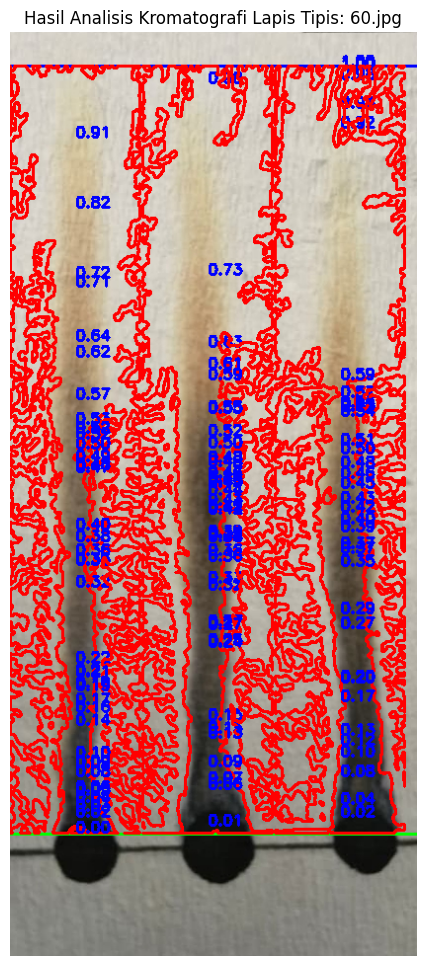

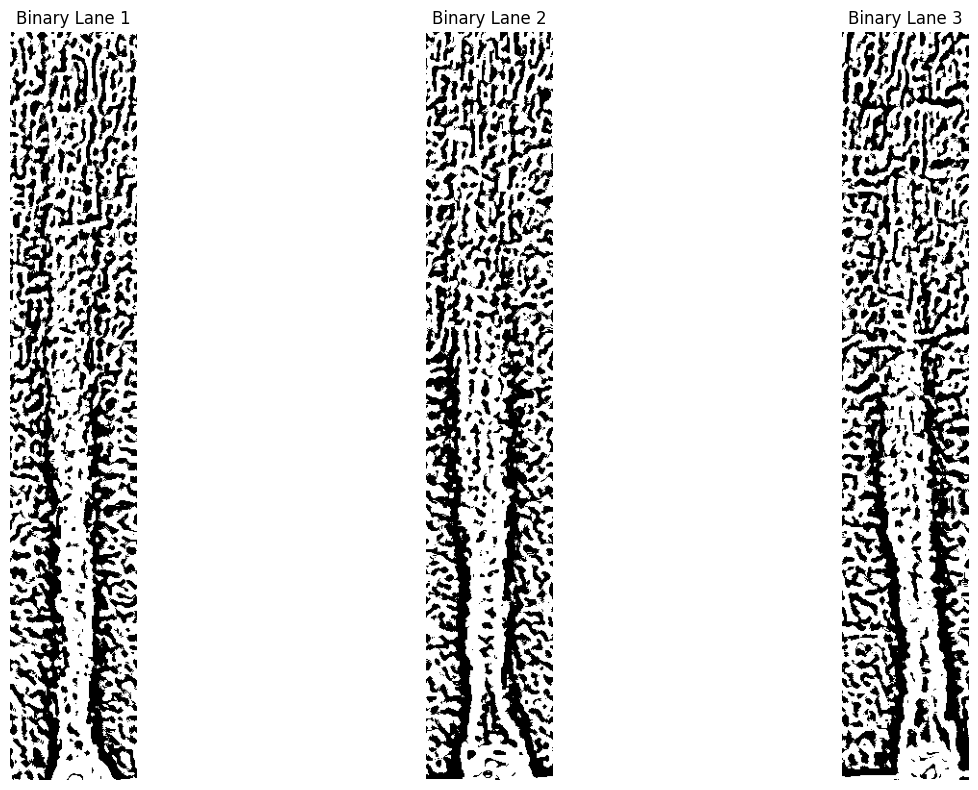

Unique Rf values for 60.jpg: [np.float64(0.002570694087403599), np.float64(0.011568123393316195), np.float64(0.02313624678663239), np.float64(0.030848329048843187), np.float64(0.03984575835475578), np.float64(0.042416452442159386), np.float64(0.05141388174807198), np.float64(0.055269922879177376), np.float64(0.05912596401028278), np.float64(0.06683804627249357), np.float64(0.07583547557840617), np.float64(0.08740359897172237), np.float64(0.08868894601542417), np.float64(0.10025706940874037), np.float64(0.10154241645244216), np.float64(0.11696658097686376), np.float64(0.12596401028277635), np.float64(0.12982005141388175), np.float64(0.13239074550128535), np.float64(0.14267352185089974), np.float64(0.14910025706940874), np.float64(0.15938303341902313), np.float64(0.16966580976863754), np.float64(0.17352185089974292), np.float64(0.18766066838046272), np.float64(0.19151670951156813), np.float64(0.19794344473007713), np.float64(0.19922879177377892), np.float64(0.20565552699228792), np.float

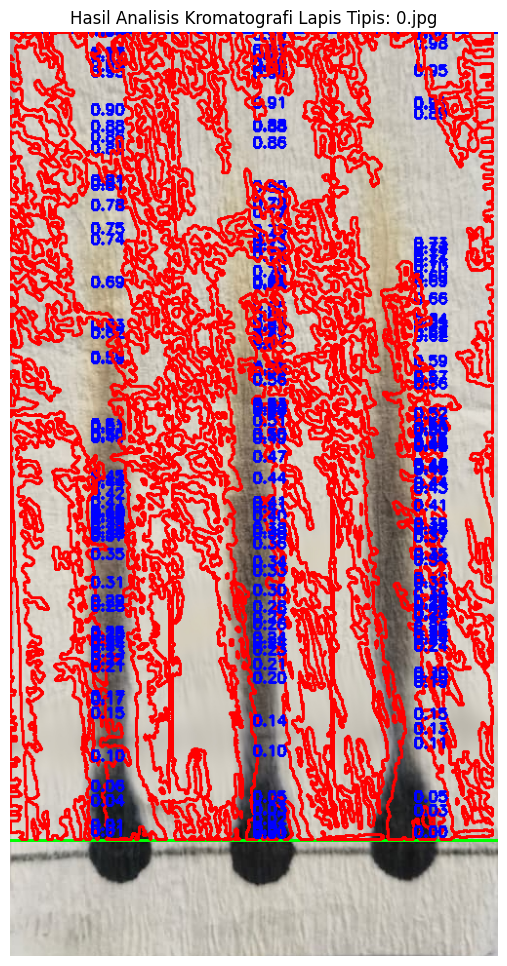

KeyboardInterrupt: 

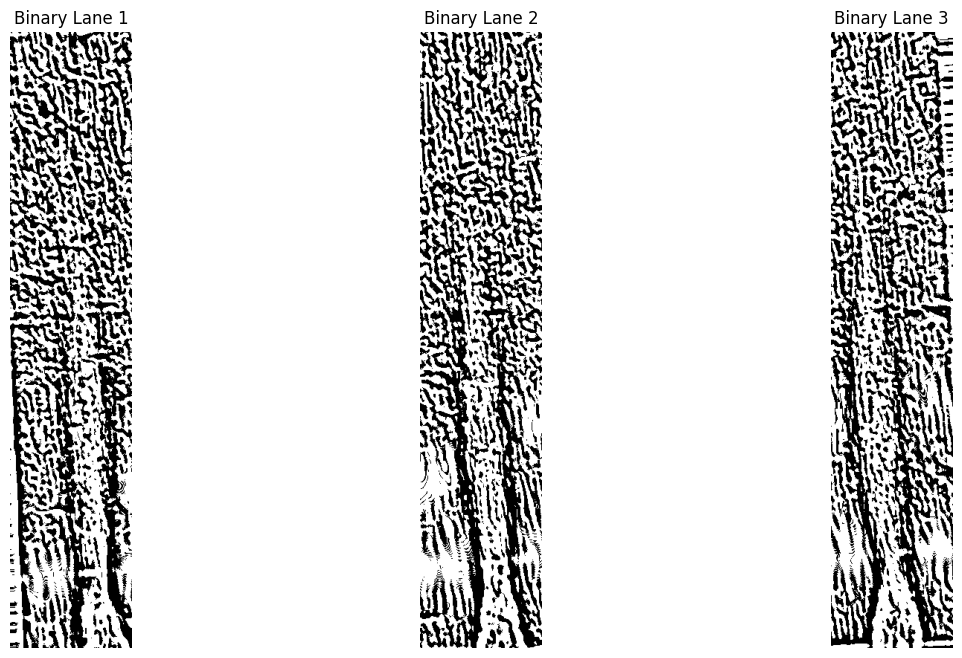

In [ ]:
# --- EKSEKUSI PROGRAM ---
if __name__ == "__main__":
    # Ganti dengan path ke folder yang berisi file gambar KLT Anda
    drive.mount('/content/drive')
    FOLDER_PATH = "/content/drive/MyDrive/bbmsmansa"

    # Ganti dengan jumlah jalur sampel pada plat KLT Anda
    NUMBER_OF_LANES = 3

    # Dapatkan daftar semua file di dalam folder
    image_files = [f for f in os.listdir(FOLDER_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Periksa apakah ada file gambar yang ditemukan
    if not image_files:
        print(f"Tidak ada file gambar (.png, .jpg, .jpeg) yang ditemukan di folder: {FOLDER_PATH}")
    else:
        # Identifikasi file kontrol
        lite_image_file = "lite.jpg"
        max_image_file = "max.jpg"

        lite_image_path = os.path.join(FOLDER_PATH, lite_image_file)
        max_image_path = os.path.join(FOLDER_PATH, max_image_file)

        # Buat daftar file gambar uji
        test_image_files = [f for f in image_files if f not in [lite_image_file, max_image_file]]

        # Analisis gambar kontrol
        print("--- Menganalisis Kontrol Minimal (lite.jpg) ---")
        lite_results = main_analysis(lite_image_path, NUMBER_OF_LANES)

        print("\n--- Menganalisis Kontrol Maksimal (max.jpg) ---")
        max_results = main_analysis(max_image_path, NUMBER_OF_LANES)

        # Gabungkan nilai Rf dari semua jalur untuk setiap kontrol
        rf_values_lite = []
        if lite_results: # Periksa apakah analisis kontrol minimal berhasil
            for lane_results in lite_results:
                rf_values_lite.extend([spot['rf'] for spot in lane_results])
        rf_set_lite = set(rf_values_lite)

        rf_values_max = []
        if max_results: # Periksa apakah analisis kontrol maksimal berhasil
            for lane_results in max_results:
                rf_values_max.extend([spot['rf'] for spot in lane_results])
        rf_set_max = set(rf_values_max)

        print("\n--- Perbandingan dengan Kontrol ---")
        print(f"Unique Rf values for Lite (Minimal Control): {sorted(list(rf_set_lite))}")
        print(f"Unique Rf values for Max (Maximal Control): {sorted(list(rf_set_max))}")
        print("-" * 50)


        # Loop melalui setiap file gambar uji dan jalankan analisis
        for image_file in test_image_files:
            image_path = os.path.join(FOLDER_PATH, image_file)
            print(f"\n--- Menganalisis File Uji: {image_file} ---")
            test_results = main_analysis(image_path, NUMBER_OF_LANES)

            if test_results is None: # Lanjutkan ke file berikutnya jika analisis gagal (misal: file tidak ditemukan)
                continue

            # Gabungkan nilai Rf dari semua jalur untuk file uji
            test_rf_values = []
            for lane_results in test_results:
                test_rf_values.extend([spot['rf'] for spot in lane_results])
            test_rf_set = set(test_rf_values)

            print(f"Unique Rf values for {image_file}: {sorted(list(test_rf_set))}")

            # Bandingkan test_rf_set dengan rf_set_lite dan rf_set_max
            # Metrik kesamaan: Jaccard index (ukuran irisan dibagi ukuran gabungan)
            intersection_lite = test_rf_set.intersection(rf_set_lite)
            union_lite = test_rf_set.union(rf_set_lite)
            similarity_lite = len(intersection_lite) / len(union_lite) if len(union_lite) > 0 else 0

            intersection_max = test_rf_set.intersection(rf_set_max)
            union_max = test_rf_set.union(rf_set_max)
            similarity_max = len(intersection_max) / len(union_max) if len(union_max) > 0 else 0

            # Tentukan kriteria perbandingan
            SIMILARITY_THRESHOLD = 0.5 # Ambang batas kesamaan (Anda bisa menyesuaikannya)

            print(f"Similarity with Lite Control: {similarity_lite:.2f}")
            print(f"Similarity with Max Control:  {similarity_max:.2f}")

            if similarity_lite > SIMILARITY_THRESHOLD and similarity_max < similarity_lite:
                print(f"Kesimpulan: Pola Rf pada {image_file} lebih mirip dengan Kontrol Minimal.")
            elif similarity_max > SIMILARITY_THRESHOLD and similarity_lite < similarity_max:
                print(f"Kesimpulan: Pola Rf pada {image_file} lebih mirip dengan Kontrol Maksimal.")
            elif similarity_lite > SIMILARITY_THRESHOLD and similarity_max > SIMILARITY_THRESHOLD:
                 print(f"Kesimpulan: Pola Rf pada {image_file} memiliki kesamaan dengan kedua kontrol.")
            else:
                print(f"Kesimpulan: Pola Rf pada {image_file} berbeda dari kedua kontrol.")

            print("=" * 50) # Pemisah antar hasil analisis gambar

# Code 2 - Deep Learning Classification


🔬 SISTEM KLASIFIKASI TLC - PIPELINE LENGKAP
⏭️  Folder augmentasi sudah ada: dataset_final/train

📊 MEMBUAT DATA GENERATORS
Found 440 images belonging to 11 classes.
Found 109 images belonging to 11 classes.
✅ Training samples: 440
✅ Validation samples: 109
✅ Jumlah kelas: 11
✅ Label mapping: {'0': 0, '10': 1, '100': 2, '20': 3, '30': 4, '40': 5, '50': 6, '60': 7, '70': 8, '80': 9, '90': 10}

🏗️  MEMBANGUN MODEL


C:\Users\naufa\AppData\Local\Temp\ipykernel_23716\1583574252.py:212: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(


✅ Model: MobileNetV2 (Transfer Learning)

📋 Model Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 8, 8, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,625,355 (10.01 MB)

 Trainable params: 364,811 (1.39 MB)

 Non-trainable params: 2,260,544 (8.62 MB)


🚀 MEMULAI TRAINING


d:\Naufal\image-class\bbmsmansa-20251006T174231Z-1-001\bbmsmansa\img-class\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 692ms/step - accuracy: 0.2468 - loss: 2.5900 - precision: 0.4312 - recall: 0.1328
Epoch 1: val_accuracy improved from None to 0.52294, saving model to tlc_model.h5


14/14 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.3341 - loss: 2.1767 - precision: 0.5325 - recall: 0.1864 - val_accuracy: 0.5229 - val_loss: 1.6177 - val_precision: 1.0000 - val_recall: 0.1193 - learning_rate: 0.0010
Epoch 2/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 918ms/step - accuracy: 0.7211 - loss: 0.9494 - precision: 0.8586 - recall: 0.5549
Epoch 2: val_accuracy improved from 0.52294 to 0.72477, saving model to tlc_model.h5


14/14 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.7409 - loss: 0.8393 - precision: 0.8814 - recall: 0.5909 - val_accuracy: 0.7248 - val_loss: 1.1651 - val_precision: 1.0000 - val_recall: 0.2294 - learning_rate: 0.0010
Epoch 3/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 872ms/step - accuracy: 0.8661 - loss: 0.5118 - precision: 0.9144 - recall: 0.7377
Epoch 3: val_accuracy improved from 0.72477 to 0.78899, saving model to tlc_model.h5


14/14 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.8659 - loss: 0.4680 - precision: 0.9135 - recall: 0.7682 - val_accuracy: 0.7890 - val_loss: 0.9063 - val_precision: 1.0000 - val_recall: 0.4587 - learning_rate: 0.0010
Epoch 4/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 865ms/step - accuracy: 0.9195 - loss: 0.2891 - precision: 0.9536 - recall: 0.8774
Epoch 4: val_accuracy improved from 0.78899 to 0.85321, saving model to tlc_model.h5


14/14 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.9273 - loss: 0.2624 - precision: 0.9520 - recall: 0.9023 - val_accuracy: 0.8532 - val_loss: 0.6873 - val_precision: 1.0000 - val_recall: 0.6055 - learning_rate: 0.0010
Epoch 5/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 846ms/step - accuracy: 0.9343 - loss: 0.2214 - precision: 0.9614 - recall: 0.9121
Epoch 5: val_accuracy improved from 0.85321 to 0.91743, saving model to tlc_model.h5


14/14 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.9432 - loss: 0.1906 - precision: 0.9577 - recall: 0.9273 - val_accuracy: 0.9174 - val_loss: 0.5176 - val_precision: 1.0000 - val_recall: 0.7064 - learning_rate: 0.0010
Epoch 6/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 837ms/step - accuracy: 0.9540 - loss: 0.1634 - precision: 0.9603 - recall: 0.9379
Epoch 6: val_accuracy improved from 0.91743 to 0.95413, saving model to tlc_model.h5


14/14 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.9523 - loss: 0.1527 - precision: 0.9606 - recall: 0.9432 - val_accuracy: 0.9541 - val_loss: 0.3844 - val_precision: 1.0000 - val_recall: 0.8073 - learning_rate: 0.0010
Epoch 7/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 857ms/step - accuracy: 0.9827 - loss: 0.0922 - precision: 0.9871 - recall: 0.9667
Epoch 7: val_accuracy improved from 0.95413 to 0.96330, saving model to tlc_model.h5


14/14 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.9705 - loss: 0.1109 - precision: 0.9792 - recall: 0.9614 - val_accuracy: 0.9633 - val_loss: 0.3020 - val_precision: 1.0000 - val_recall: 0.8624 - learning_rate: 0.0010
Epoch 8/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 830ms/step - accuracy: 0.9727 - loss: 0.0841 - precision: 0.9831 - recall: 0.9722
Epoch 8: val_accuracy improved from 0.96330 to 0.97248, saving model to tlc_model.h5


14/14 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.9727 - loss: 0.0909 - precision: 0.9816 - recall: 0.9705 - val_accuracy: 0.9725 - val_loss: 0.2525 - val_precision: 0.9901 - val_recall: 0.9174 - learning_rate: 0.0010
Epoch 9/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 836ms/step - accuracy: 0.9938 - loss: 0.0546 - precision: 0.9977 - recall: 0.9938
Epoch 9: val_accuracy did not improve from 0.97248
14/14 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.9886 - loss: 0.0577 - precision: 0.9954 - recall: 0.9886 - val_accuracy: 0.9725 - val_loss: 0.2126 - val_precision: 0.9901 - val_recall: 0.9174 - learning_rate: 0.0010
Epoch 10/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 845ms/step - accuracy: 0.9770 - loss: 0.0784 - precision: 0.9846 - recall: 0.9690
Epoch 10: val_accuracy did not improve from 0.97248
14/14 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.9864 - loss: 0.0621 - precision: 0.9931 - recall: 0.9773 - val_accuracy: 0.9541 - val_loss: 0.1906 - val_precision: 0.9806 - val_recall: 0.9266 - learning_

14/14 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.9909 - loss: 0.0536 - precision: 0.9908 - recall: 0.9795 - val_accuracy: 0.9817 - val_loss: 0.1432 - val_precision: 0.9907 - val_recall: 0.9725 - learning_rate: 0.0010
Epoch 12/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 841ms/step - accuracy: 0.9820 - loss: 0.0412 - precision: 0.9846 - recall: 0.9787
Epoch 12: val_accuracy did not improve from 0.98165
14/14 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.9864 - loss: 0.0355 - precision: 0.9886 - recall: 0.9841 - val_accuracy: 0.9817 - val_loss: 0.1201 - val_precision: 0.9907 - val_recall: 0.9725 - learning_rate: 0.0010
Epoch 13/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 869ms/step - accuracy: 0.9980 - loss: 0.0266 - precision: 0.9980 - recall: 0.9860
Epoch 13: val_accuracy did not improve from 0.98165
14/14 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.9932 - loss: 0.0319 - precision: 0.9931 - recall: 0.9864 - val_accuracy: 0.9817 - val_loss: 0.1060 - val_precision: 0.9907 - val_recall: 0.9817 - learnin

14/14 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.9909 - loss: 0.0325 - precision: 0.9909 - recall: 0.9886 - val_accuracy: 0.9908 - val_loss: 0.0834 - val_precision: 0.9907 - val_recall: 0.9817 - learning_rate: 0.0010
Epoch 15/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 826ms/step - accuracy: 0.9978 - loss: 0.0319 - precision: 0.9978 - recall: 0.9905
Epoch 15: val_accuracy did not improve from 0.99083
14/14 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.9977 - loss: 0.0242 - precision: 0.9977 - recall: 0.9955 - val_accuracy: 0.9817 - val_loss: 0.1040 - val_precision: 0.9817 - val_recall: 0.9817 - learning_rate: 0.0010
Epoch 16/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 847ms/step - accuracy: 0.9863 - loss: 0.0347 - precision: 0.9863 - recall: 0.9863
Epoch 16: val_accuracy did not improve from 0.99083
14/14 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.9886 - loss: 0.0376 - precision: 0.9886 - recall: 0.9886 - val_accuracy: 0.9633 - val_loss: 0.0880 - val_precision: 0.9722 - val_recall: 0.9633 - learnin

14/14 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.9955 - loss: 0.0247 - precision: 0.9955 - recall: 0.9955 - val_accuracy: 1.0000 - val_loss: 0.0260 - val_precision: 1.0000 - val_recall: 0.9908 - learning_rate: 0.0010
Epoch 23/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 864ms/step - accuracy: 0.9997 - loss: 0.0099 - precision: 1.0000 - recall: 0.9997
Epoch 23: val_accuracy did not improve from 1.00000
14/14 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.9977 - loss: 0.0099 - precision: 1.0000 - recall: 0.9977 - val_accuracy: 1.0000 - val_loss: 0.0231 - val_precision: 1.0000 - val_recall: 0.9908 - learning_rate: 0.0010
Epoch 24/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 824ms/step - accuracy: 1.0000 - loss: 0.0039 - precision: 1.0000 - recall: 1.0000
Epoch 24: val_accuracy did not improve from 1.00000
14/14 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 1.0000 - loss: 0.0053 - precision: 1.0000 - recall: 1.0000 - val_accuracy: 1.0000 - val_loss: 0.0216 - val_precision: 1.0000 - val_recall: 0.9908 - learnin

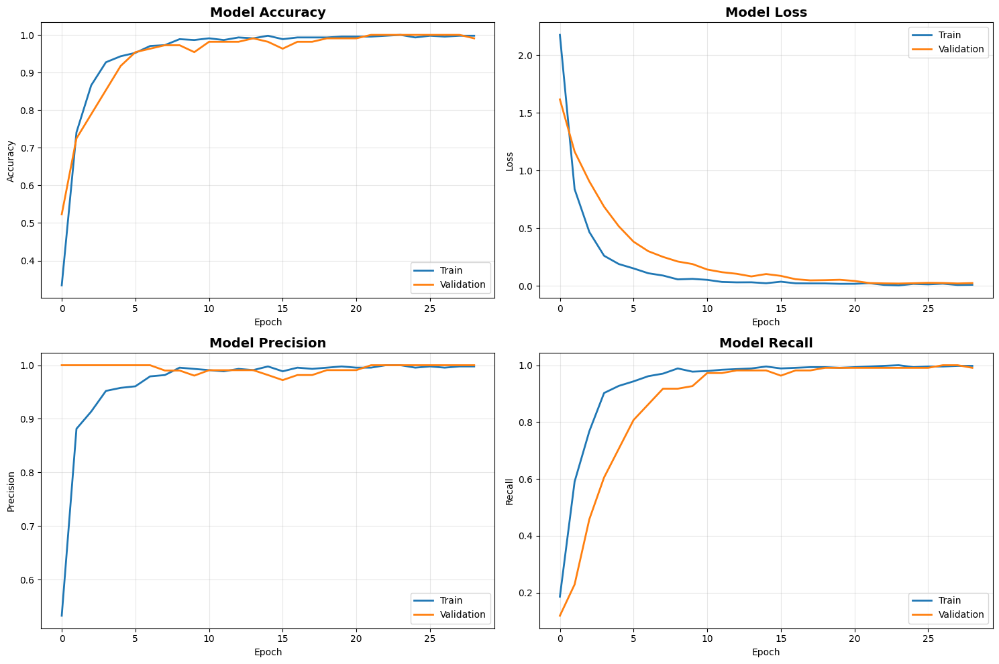


📊 EVALUASI MODEL
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 973ms/step

📋 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
          10       1.00      1.00      1.00        10
         100       1.00      1.00      1.00         9
          20       1.00      1.00      1.00        10
          30       1.00      1.00      1.00        10
          40       1.00      1.00      1.00        10
          50       1.00      1.00      1.00        10
          60       1.00      1.00      1.00        10
          70       1.00      1.00      1.00        10
          80       1.00      1.00      1.00        10
          90       1.00      1.00      1.00        10

    accuracy                           1.00       109
   macro avg       1.00      1.00      1.00       109
weighted avg       1.00      1.00      1.00       109



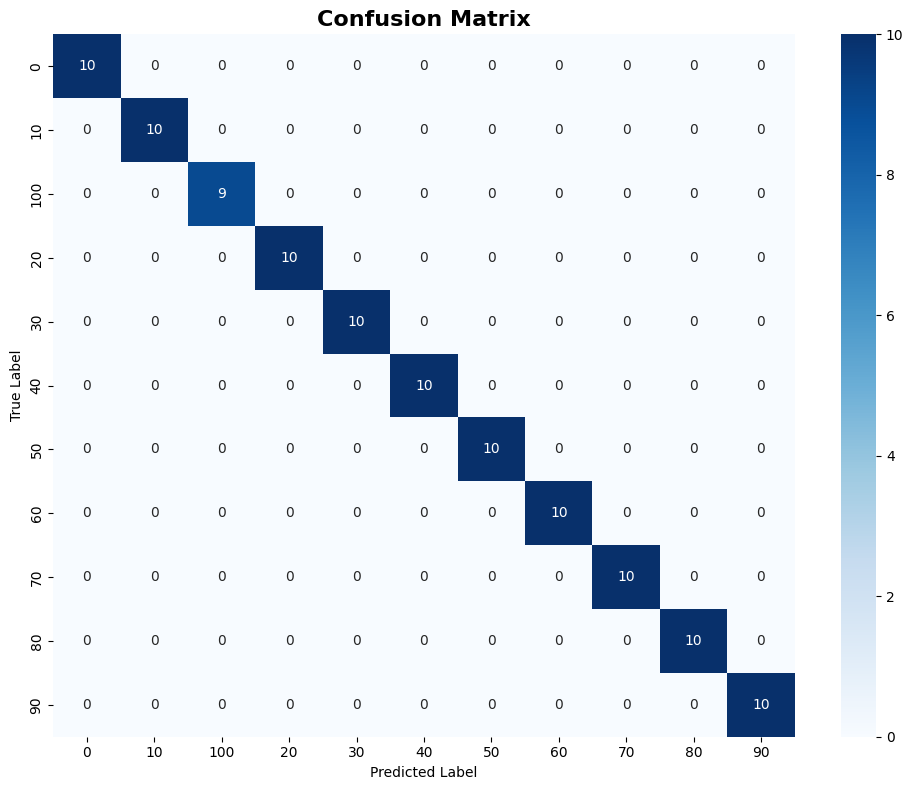


📈 Akurasi per Kelas:
  0: 100.00%
  10: 100.00%
  100: 100.00%
  20: 100.00%
  30: 100.00%
  40: 100.00%
  50: 100.00%
  60: 100.00%
  70: 100.00%
  80: 100.00%
  90: 100.00%

✅ PIPELINE SELESAI!
💾 Model tersimpan di: tlc_model.h5


In [1]:
# ==========================================================
# SISTEM KLASIFIKASI KROMATOGRAFI LAPIS TIPIS (TLC)
# Menggunakan Transfer Learning dengan MobileNetV2
# ==========================================================

import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models, callbacks
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ==========================================================
# 1. KONFIGURASI GLOBAL
# ==========================================================
class Config:
    # Path
    TRAIN_DIR = "dataset/train"
    OUTPUT_DIR = "dataset_final/train"
    VAL_DIR = "dataset_final/val"
    MODEL_SAVE_PATH = "tlc_model.h5"

    # Hyperparameters
    IMG_SIZE = (256, 256)
    BATCH_SIZE = 32
    EPOCHS = 30
    LEARNING_RATE = 0.001

    # Augmentasi
    NUM_AUGMENTED = 50
    VALIDATION_SPLIT = 0.2

    # Early stopping patience
    PATIENCE = 5

config = Config()

# ==========================================================
# 2. FUNGSI PREPROCESSING
# ==========================================================
def preprocess_image(img_array):
    """
    Preprocessing adaptif untuk citra TLC
    Args:
        img_array: numpy array (H, W, C)
    Returns:
        Preprocessed image array
    """
    img = img_array.astype(np.uint8)
    img = cv2.resize(img, config.IMG_SIZE)

    # LAB color space enhancement
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    l = cv2.equalizeHist(l)
    lab = cv2.merge((l, a, b))
    enhanced = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

    # Gaussian blur untuk noise reduction
    blurred = cv2.GaussianBlur(enhanced, (3, 3), 0)

    # Normalisasi
    normalized = blurred.astype(np.float32) / 255.0

    return normalized

# ==========================================================
# 3. AUGMENTASI DATA
# ==========================================================
def augment_dataset(input_dir, output_dir, num_augmented=50):
    """
    Augmentasi dataset dengan ImageDataGenerator
    """
    print("="*70)
    print("🔄 MEMULAI AUGMENTASI DATA")
    print("="*70)

    # Setup augmentation
    datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.15,
        height_shift_range=0.15,
        brightness_range=[0.7, 1.3],
        zoom_range=0.2,
        shear_range=10,
        horizontal_flip=True,
        vertical_flip=False,
        fill_mode='nearest'
    )

    # Validasi input directory
    if not os.path.exists(input_dir):
        raise FileNotFoundError(f"❌ Folder tidak ditemukan: {input_dir}")

    Path(output_dir).mkdir(parents=True, exist_ok=True)

    total_images = 0
    valid_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff')

    # Loop setiap label
    for label in os.listdir(input_dir):
        label_path = os.path.join(input_dir, label)

        # Skip non-directory dan hidden folders
        if not os.path.isdir(label_path) or label.startswith('.'):
            continue

        output_label_path = os.path.join(output_dir, label)
        Path(output_label_path).mkdir(parents=True, exist_ok=True)

        # Filter file gambar valid
        image_files = [
            f for f in os.listdir(label_path)
            if os.path.isfile(os.path.join(label_path, f))
            and f.lower().endswith(valid_extensions)
        ]

        if not image_files:
            print(f"⚠️  Tidak ada gambar di label '{label}', dilewati")
            continue

        # Augmentasi per gambar
        for filename in image_files:
            img_path = os.path.join(label_path, filename)
            try:
                img = load_img(img_path, target_size=config.IMG_SIZE)
                x = img_to_array(img)
                x = np.expand_dims(x, 0)

                prefix = Path(filename).stem
                i = 0
                for batch in datagen.flow(
                    x,
                    batch_size=1,
                    save_to_dir=output_label_path,
                    save_prefix=f"{prefix}_aug",
                    save_format='png'
                ):
                    i += 1
                    if i >= num_augmented:
                        break

                total_images += num_augmented
                print(f"✅ Label '{label}': {num_augmented} gambar dari '{filename}'")

            except Exception as e:
                print(f"❌ Error pada {img_path}: {e}")
                continue

    print(f"\n✅ Augmentasi selesai! Total {total_images} gambar di '{output_dir}'")
    return total_images

# ==========================================================
# 4. DATA GENERATOR
# ==========================================================
def create_data_generators(train_dir, validation_split=0.2):
    """
    Membuat train dan validation generator
    """
    print("\n" + "="*70)
    print("📊 MEMBUAT DATA GENERATORS")
    print("="*70)

    train_datagen = ImageDataGenerator(
        rescale=1./255,
        validation_split=validation_split
    )

    train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=config.IMG_SIZE,
        batch_size=config.BATCH_SIZE,
        class_mode='categorical',
        subset='training',
        shuffle=True
    )

    val_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=config.IMG_SIZE,
        batch_size=config.BATCH_SIZE,
        class_mode='categorical',
        subset='validation',
        shuffle=False
    )

    print(f"✅ Training samples: {train_generator.samples}")
    print(f"✅ Validation samples: {val_generator.samples}")
    print(f"✅ Jumlah kelas: {train_generator.num_classes}")
    print(f"✅ Label mapping: {train_generator.class_indices}")

    return train_generator, val_generator

# ==========================================================
# 5. ARSITEKTUR MODEL
# ==========================================================
def build_model(num_classes, use_transfer_learning=True):
    """
    Membangun model CNN dengan opsi transfer learning
    """
    print("\n" + "="*70)
    print("🏗️  MEMBANGUN MODEL")
    print("="*70)

    if use_transfer_learning:
        # MobileNetV2 Transfer Learning
        base_model = MobileNetV2(
            weights='imagenet',
            include_top=False,
            input_shape=(*config.IMG_SIZE, 3)
        )
        base_model.trainable = False  # Freeze base layers

        model = models.Sequential([
            base_model,
            layers.GlobalAveragePooling2D(),
            layers.BatchNormalization(),
            layers.Dense(256, activation='relu'),
            layers.Dropout(0.5),
            layers.Dense(128, activation='relu'),
            layers.Dropout(0.3),
            layers.Dense(num_classes, activation='softmax')
        ])

        print("✅ Model: MobileNetV2 (Transfer Learning)")
    else:
        # CNN dari scratch
        model = models.Sequential([
            layers.Conv2D(32, (3,3), activation='relu', input_shape=(*config.IMG_SIZE, 3)),
            layers.BatchNormalization(),
            layers.MaxPooling2D(2,2),

            layers.Conv2D(64, (3,3), activation='relu'),
            layers.BatchNormalization(),
            layers.MaxPooling2D(2,2),

            layers.Conv2D(128, (3,3), activation='relu'),
            layers.BatchNormalization(),
            layers.MaxPooling2D(2,2),

            layers.Conv2D(256, (3,3), activation='relu'),
            layers.BatchNormalization(),
            layers.MaxPooling2D(2,2),

            layers.Flatten(),
            layers.Dense(256, activation='relu'),
            layers.Dropout(0.5),
            layers.Dense(128, activation='relu'),
            layers.Dropout(0.3),
            layers.Dense(num_classes, activation='softmax')
        ])

        print("✅ Model: Custom CNN (from scratch)")

    # Compile model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=config.LEARNING_RATE),
        loss='categorical_crossentropy',
        metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
    )

    print(f"\n📋 Model Summary:")
    model.summary()

    return model

# ==========================================================
# 6. CALLBACKS
# ==========================================================
def get_callbacks():
    """Setup callbacks untuk training"""
    callback_list = [
        callbacks.EarlyStopping(
            monitor='val_loss',
            patience=config.PATIENCE,
            restore_best_weights=True,
            verbose=1
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=3,
            min_lr=1e-7,
            verbose=1
        ),
        callbacks.ModelCheckpoint(
            config.MODEL_SAVE_PATH,
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        )
    ]

    return callback_list

# ==========================================================
# 7. TRAINING
# ==========================================================
def train_model(model, train_gen, val_gen):
    """
    Training model dengan callbacks
    """
    print("\n" + "="*70)
    print("🚀 MEMULAI TRAINING")
    print("="*70)

    history = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=config.EPOCHS,
        callbacks=get_callbacks(),
        verbose=1
    )

    print("\n✅ Training selesai!")
    return history

# ==========================================================
# 8. VISUALISASI HASIL
# ==========================================================
def plot_training_history(history):
    """
    Plot training history dengan 4 metrik
    """
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    # Accuracy
    axes[0, 0].plot(history.history['accuracy'], label='Train', linewidth=2)
    axes[0, 0].plot(history.history['val_accuracy'], label='Validation', linewidth=2)
    axes[0, 0].set_title('Model Accuracy', fontsize=14, fontweight='bold')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Accuracy')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # Loss
    axes[0, 1].plot(history.history['loss'], label='Train', linewidth=2)
    axes[0, 1].plot(history.history['val_loss'], label='Validation', linewidth=2)
    axes[0, 1].set_title('Model Loss', fontsize=14, fontweight='bold')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # Precision
    axes[1, 0].plot(history.history['precision'], label='Train', linewidth=2)
    axes[1, 0].plot(history.history['val_precision'], label='Validation', linewidth=2)
    axes[1, 0].set_title('Model Precision', fontsize=14, fontweight='bold')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Precision')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)

    # Recall
    axes[1, 1].plot(history.history['recall'], label='Train', linewidth=2)
    axes[1, 1].plot(history.history['val_recall'], label='Validation', linewidth=2)
    axes[1, 1].set_title('Model Recall', fontsize=14, fontweight='bold')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Recall')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

def plot_confusion_matrix(model, val_generator):
    """
    Plot confusion matrix untuk validasi
    """
    print("\n" + "="*70)
    print("📊 EVALUASI MODEL")
    print("="*70)

    # Prediksi
    y_pred = model.predict(val_generator)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = val_generator.classes

    # Classification report
    class_names = list(val_generator.class_indices.keys())
    print("\n📋 Classification Report:")
    print(classification_report(y_true, y_pred_classes, target_names=class_names))

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred_classes)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

    # Hitung akurasi per kelas
    class_accuracy = cm.diagonal() / cm.sum(axis=1)
    print("\n📈 Akurasi per Kelas:")
    for i, acc in enumerate(class_accuracy):
        print(f"  {class_names[i]}: {acc:.2%}")

# ==========================================================
# 9. PIPELINE UTAMA
# ==========================================================
def main():
    """
    Pipeline lengkap: Augmentasi → Training → Evaluasi
    """
    print("\n" + "="*70)
    print("🔬 SISTEM KLASIFIKASI TLC - PIPELINE LENGKAP")
    print("="*70)

    # 1. Augmentasi (opsional, skip jika sudah ada)
    if not os.path.exists(config.OUTPUT_DIR):
        augment_dataset(
            config.TRAIN_DIR,
            config.OUTPUT_DIR,
            config.NUM_AUGMENTED
        )
    else:
        print(f"⏭️  Folder augmentasi sudah ada: {config.OUTPUT_DIR}")

    # 2. Buat data generators
    train_gen, val_gen = create_data_generators(
        config.OUTPUT_DIR,
        config.VALIDATION_SPLIT
    )

    # 3. Build model
    model = build_model(
        num_classes=train_gen.num_classes,
        use_transfer_learning=True  # Set False untuk CNN dari scratch
    )

    # 4. Training
    history = train_model(model, train_gen, val_gen)

    # 5. Visualisasi hasil
    plot_training_history(history)
    plot_confusion_matrix(model, val_gen)

    print("\n" + "="*70)
    print("✅ PIPELINE SELESAI!")
    print(f"💾 Model tersimpan di: {config.MODEL_SAVE_PATH}")
    print("="*70)

    return model, history

# ==========================================================
# EKSEKUSI
# ==========================================================
if __name__ == "__main__":
    model, history = main()

# Code 3 - CLAHE + Otsu

🔍 Ditemukan 11 gambar untuk dianalisis


[1/11] Memproses: 0.jpg


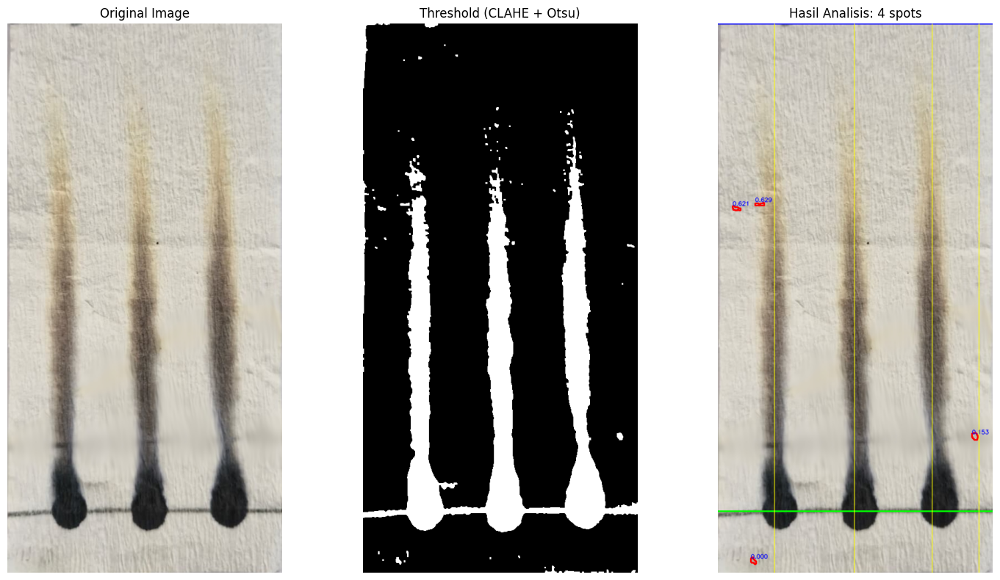


📊 Hasil Analisis: 0.jpg


,spot_id,lane,rf,area,x,y,width,height
0,1,1.0,0.000,78,66,1002,11,14
1,2,1.0,0.629,65,78,337,18,6
2,3,4.0,0.153,112,479,770,12,14
3,4,NaN,0.621,77,35,344,16,9



📈 Statistik per Lane:
----------------------------------------------------------------------
  Lane 1: 2 spots | Rf range: 0.000 - 0.629 | Mean: 0.315
  Lane 4: 1 spots | Rf range: 0.153 - 0.153 | Mean: 0.153

📌 Ringkasan Global:
 • Total spots terdeteksi: 4
 • Rf minimum : 0.000
 • Rf maksimum: 0.629
 • Rf rata-rata: 0.351
 • Jumlah lanes terdeteksi: 4

[2/11] Memproses: 10.jpg


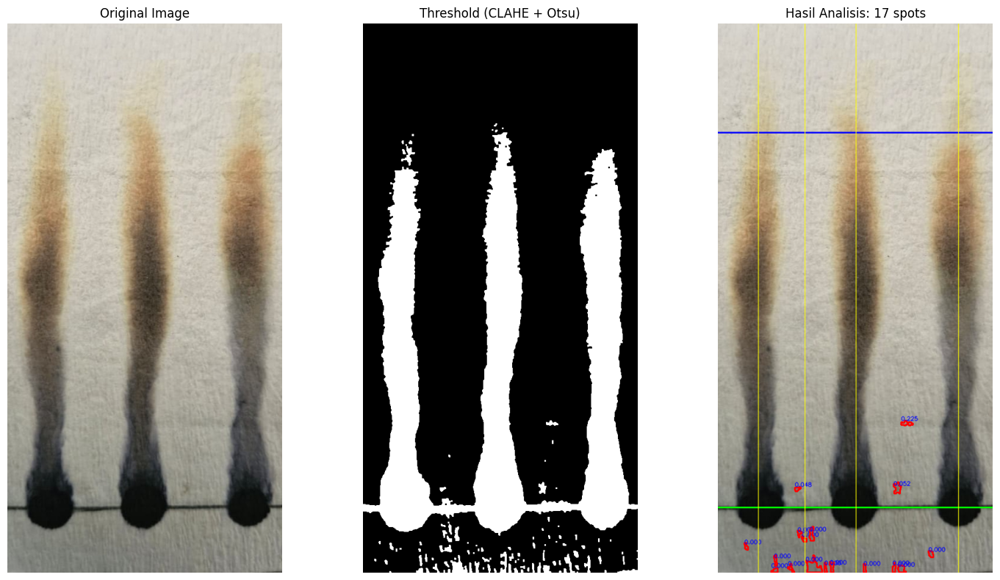


📊 Hasil Analisis: 10.jpg


,spot_id,lane,rf,area,x,y,width,height
0,1,1.0,0.000,71,105,1019,13,9
1,2,1.0,0.000,73,107,1001,7,21
2,3,1.0,0.000,55,53,975,8,14
3,4,2.0,0.000,67,136,1015,13,17
4,5,2.0,0.000,63,201,1014,6,19
5,6,2.0,0.000,474,179,1007,32,33
6,7,2.0,0.000,59,161,961,10,12
7,8,2.0,0.000,56,152,952,9,14
8,9,2.0,0.000,148,175,951,10,27
9,10,2.0,0.048,55,149,868,12,9



📈 Statistik per Lane:
----------------------------------------------------------------------
  Lane 1: 3 spots | Rf range: 0.000 - 0.000 | Mean: 0.000
  Lane 2: 7 spots | Rf range: 0.000 - 0.048 | Mean: 0.007
  Lane 3: 2 spots | Rf range: 0.000 - 0.000 | Mean: 0.000

📌 Ringkasan Global:
 • Total spots terdeteksi: 17
 • Rf minimum : 0.000
 • Rf maksimum: 0.225
 • Rf rata-rata: 0.019
 • Jumlah lanes terdeteksi: 4

[3/11] Memproses: 100.jpg


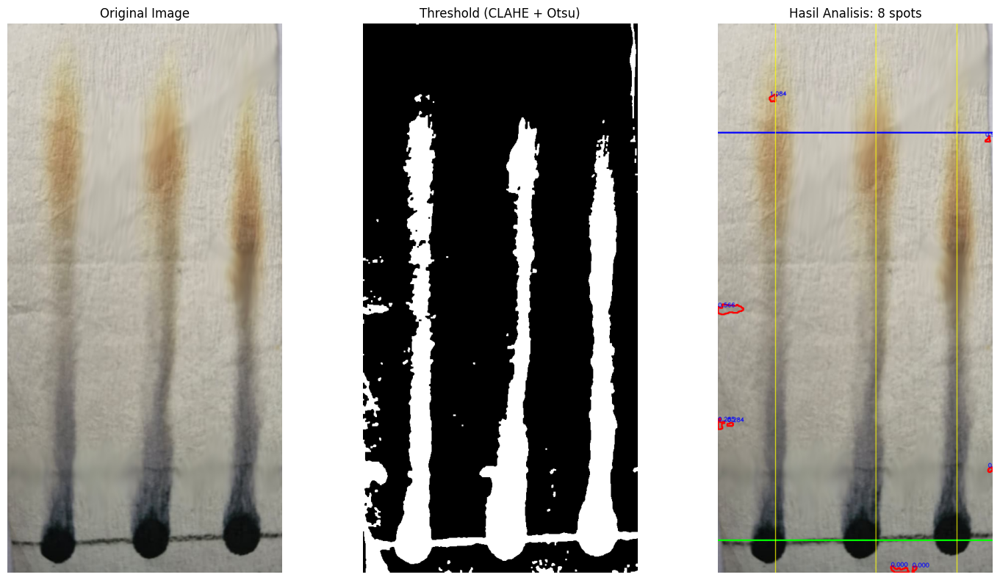


📊 Hasil Analisis: 100.jpg


,spot_id,lane,rf,area,x,y,width,height
0,1,1.0,1.084,108,103,139,14,14
1,2,2.0,0.000,227,339,1017,34,13
2,3,NaN,0.000,54,366,1018,9,12
3,4,NaN,0.172,52,507,832,9,10
4,5,NaN,0.284,52,23,747,12,7
5,6,NaN,0.285,131,6,746,13,21
6,7,NaN,0.566,604,24,533,48,20
7,8,NaN,0.984,51,503,215,10,12



📈 Statistik per Lane:
----------------------------------------------------------------------
  Lane 1: 1 spots | Rf range: 1.084 - 1.084 | Mean: 1.084
  Lane 2: 1 spots | Rf range: 0.000 - 0.000 | Mean: 0.000

📌 Ringkasan Global:
 • Total spots terdeteksi: 8
 • Rf minimum : 0.000
 • Rf maksimum: 1.084
 • Rf rata-rata: 0.422
 • Jumlah lanes terdeteksi: 3

[4/11] Memproses: 20.jpg


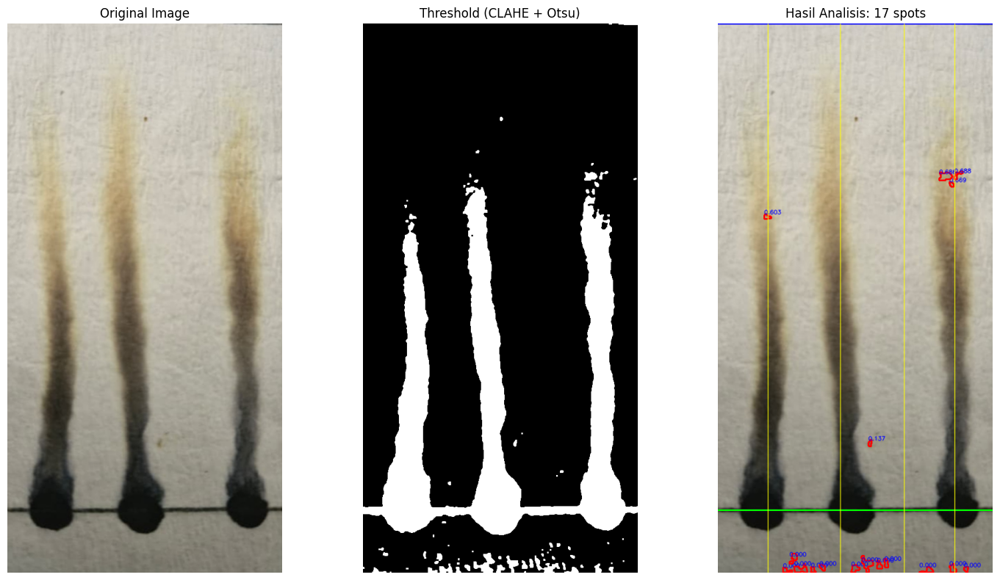


📊 Hasil Analisis: 20.jpg


,spot_id,lane,rf,area,x,y,width,height
0,1,1.0,0.000,94,130,1019,18,10
1,2,1.0,0.000,130,140,998,15,20
2,3,1.0,0.603,76,93,360,14,10
3,4,2.0,0.000,63,178,1018,10,11
4,5,2.0,0.000,140,256,1016,17,15
5,6,2.0,0.000,78,194,1015,11,12
6,7,3.0,0.000,115,388,1018,27,11
7,8,3.0,0.000,103,301,1009,11,16
8,9,3.0,0.000,90,314,1006,8,17
9,10,4.0,0.000,60,462,1018,9,11



📈 Statistik per Lane:
----------------------------------------------------------------------
  Lane 1: 3 spots | Rf range: 0.000 - 0.603 | Mean: 0.201
  Lane 2: 3 spots | Rf range: 0.000 - 0.000 | Mean: 0.000
  Lane 3: 3 spots | Rf range: 0.000 - 0.000 | Mean: 0.000
  Lane 4: 5 spots | Rf range: 0.000 - 0.688 | Mean: 0.409

📌 Ringkasan Global:
 • Total spots terdeteksi: 17
 • Rf minimum : 0.000
 • Rf maksimum: 0.688
 • Rf rata-rata: 0.164
 • Jumlah lanes terdeteksi: 4

[5/11] Memproses: 30.jpg


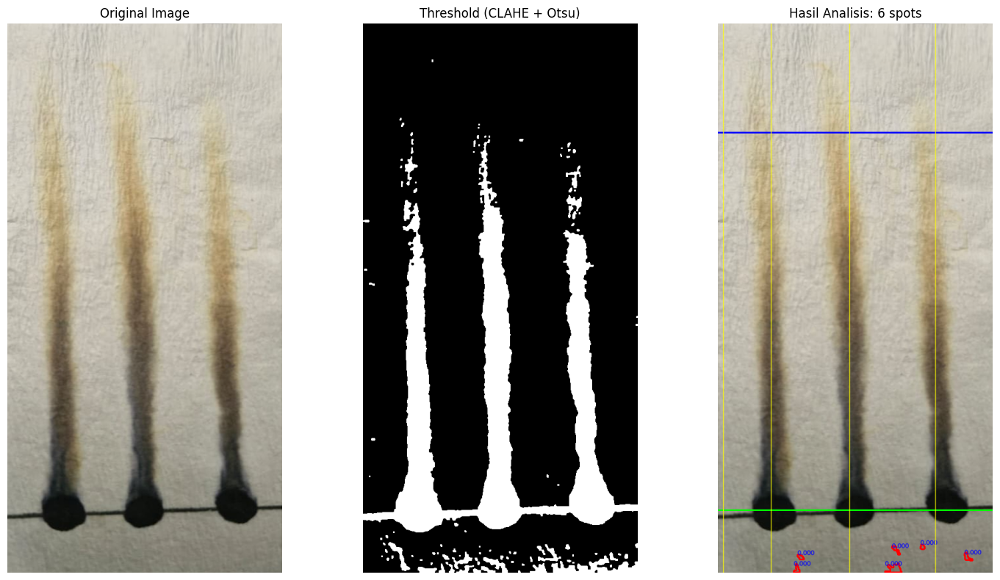


📊 Hasil Analisis: 30.jpg


,spot_id,lane,rf,area,x,y,width,height
0,1,2.0,0,89,147,1015,12,17
1,2,4.0,0,54,381,976,9,10
2,3,NaN,0,286,327,1015,32,18
3,4,NaN,0,70,154,995,13,10
4,5,NaN,0,101,467,994,16,16
5,6,NaN,0,82,332,982,16,17



📈 Statistik per Lane:
----------------------------------------------------------------------
  Lane 2: 1 spots | Rf range: 0.000 - 0.000 | Mean: 0.000
  Lane 4: 1 spots | Rf range: 0.000 - 0.000 | Mean: 0.000

📌 Ringkasan Global:
 • Total spots terdeteksi: 6
 • Rf minimum : 0.000
 • Rf maksimum: 0.000
 • Rf rata-rata: 0.000
 • Jumlah lanes terdeteksi: 4

[6/11] Memproses: 40.jpg


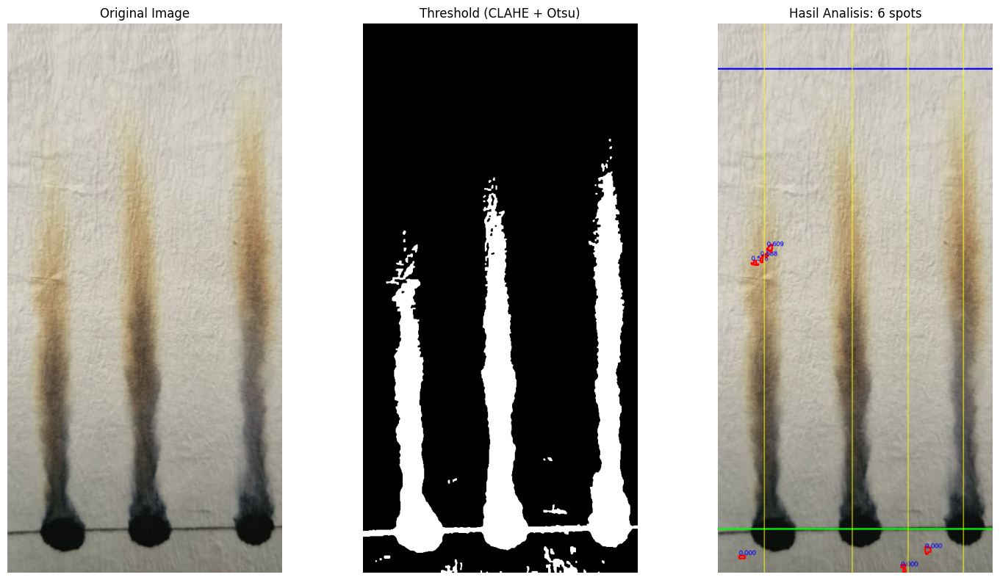


📊 Hasil Analisis: 40.jpg


,spot_id,lane,rf,area,x,y,width,height
0,1,1,0.000,53,45,995,12,6
1,2,1,0.578,52,69,446,14,9
2,3,1,0.588,73,86,437,14,17
3,4,1,0.609,79,96,419,11,15
4,5,3,0.000,74,345,1016,9,16
5,6,3,0.000,105,391,982,11,15



📈 Statistik per Lane:
----------------------------------------------------------------------
  Lane 1: 4 spots | Rf range: 0.000 - 0.609 | Mean: 0.444
  Lane 3: 2 spots | Rf range: 0.000 - 0.000 | Mean: 0.000

📌 Ringkasan Global:
 • Total spots terdeteksi: 6
 • Rf minimum : 0.000
 • Rf maksimum: 0.609
 • Rf rata-rata: 0.296
 • Jumlah lanes terdeteksi: 4

[7/11] Memproses: 50.jpg


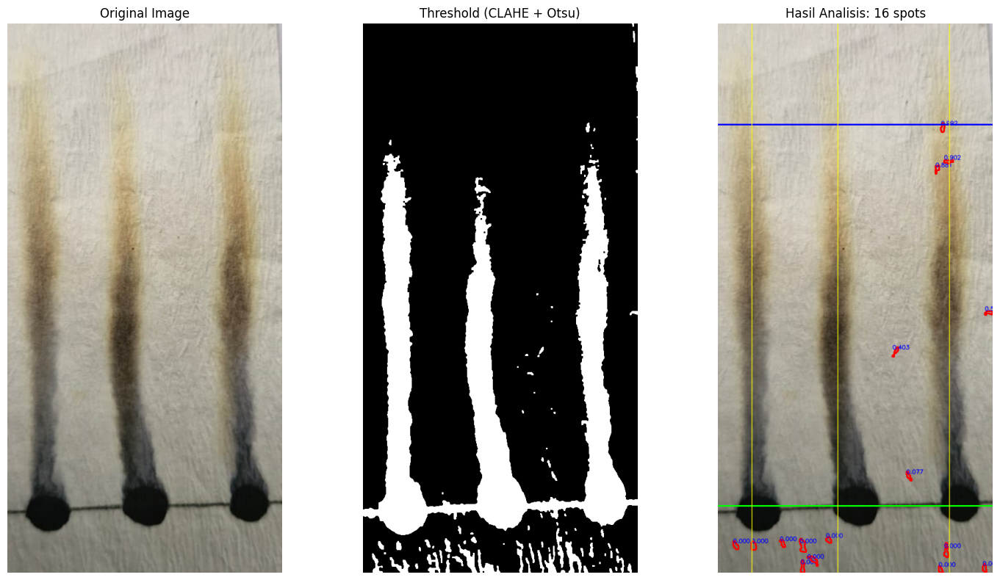


📊 Hasil Analisis: 50.jpg


,spot_id,lane,rf,area,x,y,width,height
0,1,1.0,0.000,117,67,973,10,17
1,2,1.0,0.000,94,33,973,11,16
2,3,2.0,0.000,121,176,1002,21,19
3,4,2.0,0.000,73,206,963,11,12
4,5,3.0,0.000,65,415,1017,9,13
5,6,3.0,0.000,128,425,982,9,28
6,7,3.0,0.881,71,409,272,8,17
7,8,3.0,0.902,72,430,258,18,8
8,9,3.0,0.992,83,419,194,8,18
9,10,NaN,0.000,78,497,1015,8,17



📈 Statistik per Lane:
----------------------------------------------------------------------
  Lane 1: 2 spots | Rf range: 0.000 - 0.000 | Mean: 0.000
  Lane 2: 2 spots | Rf range: 0.000 - 0.000 | Mean: 0.000
  Lane 3: 5 spots | Rf range: 0.000 - 0.992 | Mean: 0.555

📌 Ringkasan Global:
 • Total spots terdeteksi: 16
 • Rf minimum : 0.000
 • Rf maksimum: 0.992
 • Rf rata-rata: 0.235
 • Jumlah lanes terdeteksi: 3

[8/11] Memproses: 60.jpg


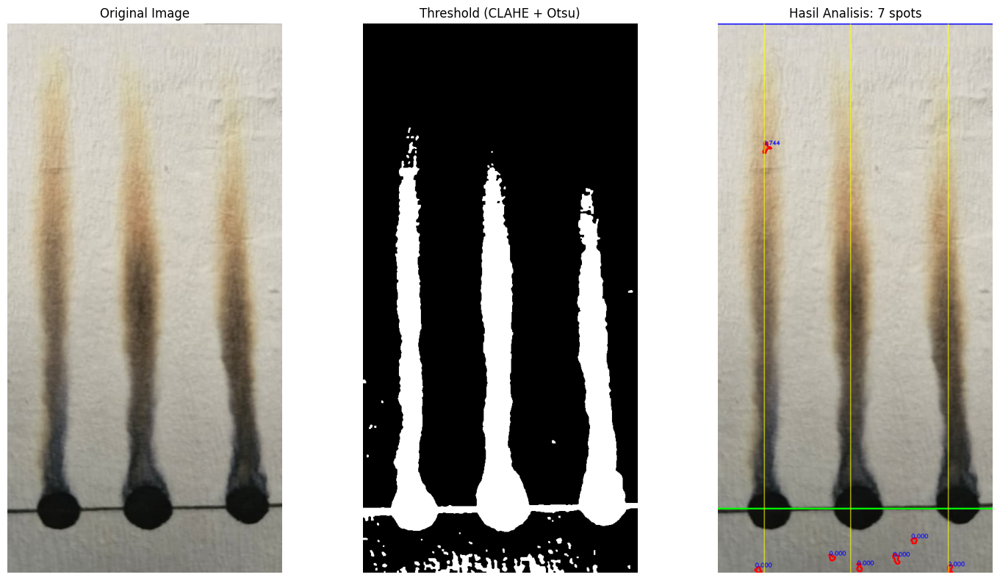


📊 Hasil Analisis: 60.jpg


,spot_id,lane,rf,area,x,y,width,height
0,1,1.0,0.000,77,75,1018,13,11
1,2,1.0,0.744,119,92,231,16,21
2,3,2.0,0.000,91,264,1014,10,16
3,4,2.0,0.000,75,213,996,12,12
4,5,3.0,0.000,87,432,1016,9,15
5,6,NaN,0.000,128,332,998,13,19
6,7,NaN,0.000,74,365,964,11,11



📈 Statistik per Lane:
----------------------------------------------------------------------
  Lane 1: 2 spots | Rf range: 0.000 - 0.744 | Mean: 0.372
  Lane 2: 2 spots | Rf range: 0.000 - 0.000 | Mean: 0.000
  Lane 3: 1 spots | Rf range: 0.000 - 0.000 | Mean: 0.000

📌 Ringkasan Global:
 • Total spots terdeteksi: 7
 • Rf minimum : 0.000
 • Rf maksimum: 0.744
 • Rf rata-rata: 0.106
 • Jumlah lanes terdeteksi: 3

[9/11] Memproses: 70.jpg


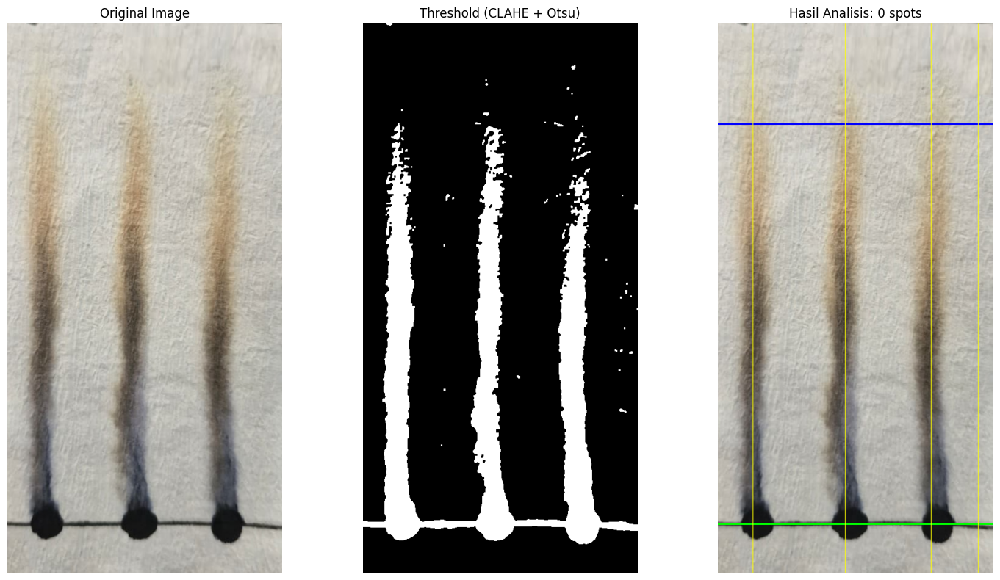


❌ Tidak ada spot terdeteksi pada 70.jpg

[10/11] Memproses: 80.jpg


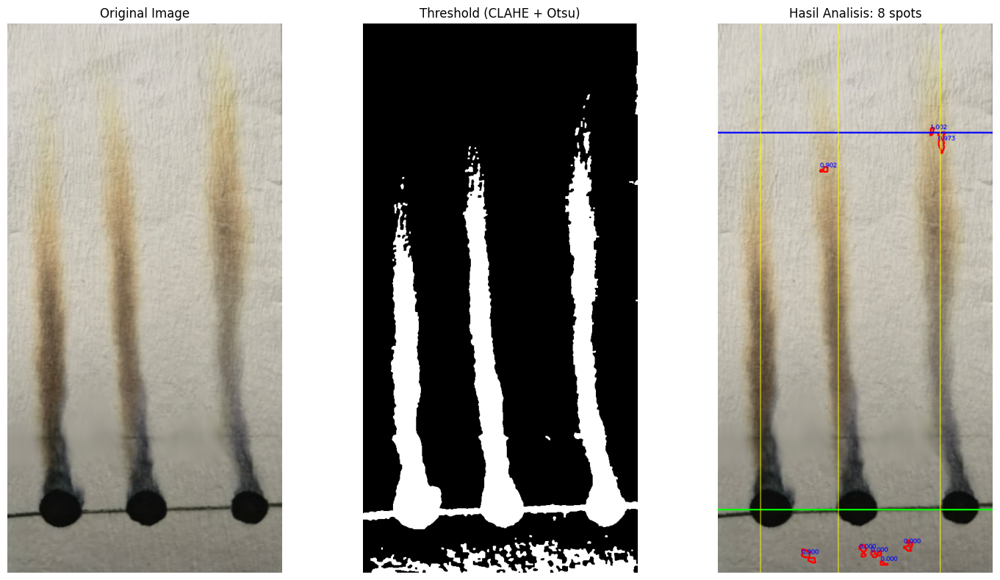


📊 Hasil Analisis: 80.jpg


,spot_id,lane,rf,area,x,y,width,height
0,1,2.0,0.000,159,270,983,14,23
1,2,2.0,0.902,86,197,272,15,10
2,3,3.0,0.973,294,417,222,14,40
3,4,3.0,1.002,64,399,201,8,15
4,5,NaN,0.000,50,310,1006,14,8
5,6,NaN,0.000,134,295,989,20,13
6,7,NaN,0.000,269,169,993,26,26
7,8,NaN,0.000,150,354,973,17,21



📈 Statistik per Lane:
----------------------------------------------------------------------
  Lane 2: 2 spots | Rf range: 0.000 - 0.902 | Mean: 0.451
  Lane 3: 2 spots | Rf range: 0.973 - 1.002 | Mean: 0.988

📌 Ringkasan Global:
 • Total spots terdeteksi: 8
 • Rf minimum : 0.000
 • Rf maksimum: 1.002
 • Rf rata-rata: 0.360
 • Jumlah lanes terdeteksi: 3

[11/11] Memproses: 90.jpg


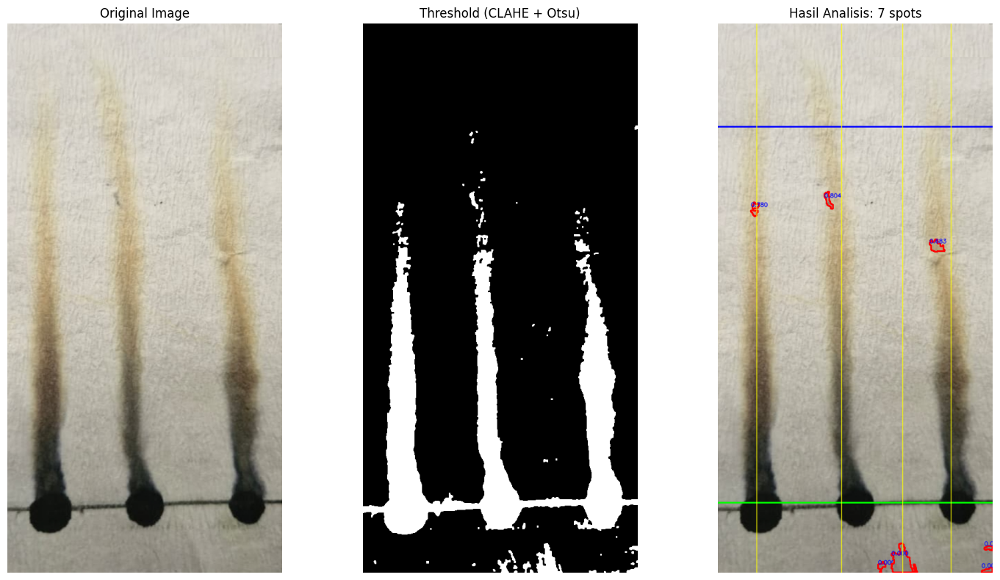


📊 Hasil Analisis: 90.jpg


,spot_id,lane,rf,area,x,y,width,height
0,1,1.0,0.780,191,69,346,16,27
1,2,2.0,0.804,212,206,329,17,33
2,3,3.0,0.000,136,305,1013,15,21
3,4,3.0,0.000,1367,347,996,49,55
4,5,4.0,0.683,390,408,414,29,24
5,6,NaN,0.000,122,501,1019,21,10
6,7,NaN,0.000,89,504,978,16,9



📈 Statistik per Lane:
----------------------------------------------------------------------
  Lane 1: 1 spots | Rf range: 0.780 - 0.780 | Mean: 0.780
  Lane 2: 1 spots | Rf range: 0.804 - 0.804 | Mean: 0.804
  Lane 3: 2 spots | Rf range: 0.000 - 0.000 | Mean: 0.000
  Lane 4: 1 spots | Rf range: 0.683 - 0.683 | Mean: 0.683

📌 Ringkasan Global:
 • Total spots terdeteksi: 7
 • Rf minimum : 0.000
 • Rf maksimum: 0.804
 • Rf rata-rata: 0.324
 • Jumlah lanes terdeteksi: 4

📊 SUMMARY AKHIR - SEMUA GAMBAR
Total gambar diproses: 10
Total spots terdeteksi: 96
Rf range: 0.000 - 1.084

📋 Ringkasan per File:


,Jumlah Spots,Rf Min,Rf Max,Rf Mean
filename,,,,
0.jpg,4,0.0,0.629,0.351
10.jpg,17,0.0,0.225,0.019
100.jpg,8,0.0,1.084,0.422
20.jpg,17,0.0,0.688,0.164
30.jpg,6,0.0,0.000,0.000
40.jpg,6,0.0,0.609,0.296
50.jpg,16,0.0,0.992,0.235
60.jpg,7,0.0,0.744,0.106
80.jpg,8,0.0,1.002,0.360


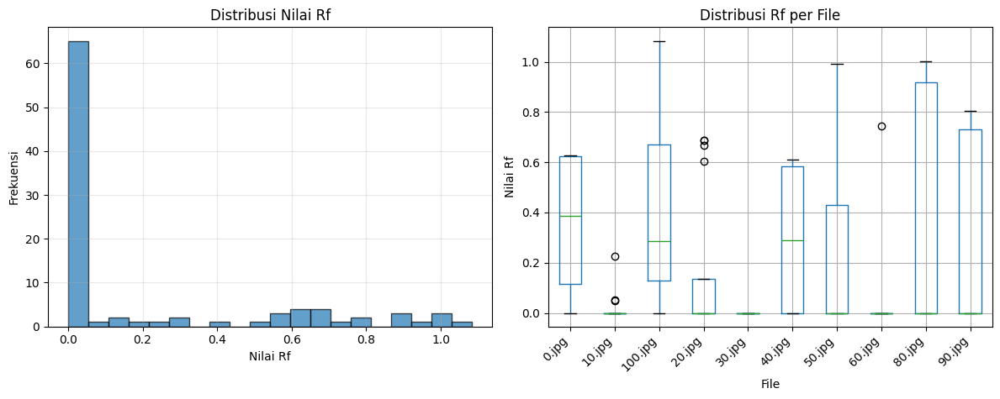


📄 Data Lengkap:


,spot_id,lane,rf,area,x,y,width,height,filename
0,1,1.0,0.000,78,66,1002,11,14,0.jpg
1,2,1.0,0.629,65,78,337,18,6,0.jpg
2,3,4.0,0.153,112,479,770,12,14,0.jpg
3,4,NaN,0.621,77,35,344,16,9,0.jpg
4,1,1.0,0.000,71,105,1019,13,9,10.jpg
...,...,...,...,...,...,...,...,...,...
91,3,3.0,0.000,136,305,1013,15,21,90.jpg
92,4,3.0,0.000,1367,347,996,49,55,90.jpg
93,5,4.0,0.683,390,408,414,29,24,90.jpg
94,6,NaN,0.000,122,501,1019,21,10,90.jpg


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d

# === KONFIGURASI DASAR ===
input_dir = "input"  # folder berisi gambar TLC

# === PARAMETER ===
img_size = (512, 1024)
min_contour_area = 50
aspect_ratio_range = (0.3, 3.0)
circularity_min = 0.3

# === FUNGSI DETEKSI GARIS HORIZONTAL ===
def detect_baseline_and_solvent(gray_img):
    """Deteksi baseline dan solvent front secara otomatis"""
    h, w = gray_img.shape
    row_intensity = np.mean(gray_img, axis=1)

    # Baseline: area gelap di bawah (80% bawah)
    baseline_region = row_intensity[int(h*0.8):]
    baseline_y = int(h*0.8) + np.argmin(baseline_region)

    # Solvent front: area gelap di atas (20% atas)
    solvent_region = row_intensity[:int(h*0.2)]
    solvent_y = np.argmin(solvent_region)

    return baseline_y, solvent_y

# === FUNGSI DETEKSI LANE ===
def detect_lanes(thresh, num_expected_lanes=3):
    """Deteksi kolom/lane TLC secara otomatis"""
    h, w = thresh.shape
    col_projection = np.sum(thresh, axis=0)
    col_smooth = gaussian_filter1d(col_projection, sigma=10)
    peaks, _ = find_peaks(col_smooth, distance=w//num_expected_lanes//2)

    if len(peaks) == 0:
        return np.linspace(w//6, 5*w//6, num_expected_lanes).astype(int)

    return sorted(peaks)

# === FUNGSI PENGHITUNGAN RF ===
def calculate_rf(y_center, baseline_y, solvent_front_y):
    """Hitung nilai Rf: (jarak spot / jarak pelarut)"""
    if baseline_y == solvent_front_y:
        return 0
    rf = (baseline_y - y_center) / (baseline_y - solvent_front_y)
    return round(max(0, min(rf, 1.1)), 3)

# === FUNGSI VALIDASI SPOT ===
def is_valid_spot(contour, area):
    """Validasi apakah contour adalah spot yang valid"""
    if area < min_contour_area:
        return False

    x, y, w, h = cv2.boundingRect(contour)
    aspect = w / float(h) if h > 0 else 0
    if not (aspect_ratio_range[0] <= aspect <= aspect_ratio_range[1]):
        return False

    perimeter = cv2.arcLength(contour, True)
    if perimeter == 0:
        return False
    circularity = 4 * np.pi * area / (perimeter ** 2)
    if circularity < circularity_min:
        return False

    return True

# === FUNGSI ASSIGN SPOT KE LANE ===
def assign_spot_to_lane(x_center, lane_positions, tolerance=50):
    """Assign spot ke lane terdekat"""
    distances = [abs(x_center - lp) for lp in lane_positions]
    min_dist = min(distances)
    if min_dist <= tolerance:
        return distances.index(min_dist) + 1
    return None

# === FUNGSI ANALISIS GAMBAR ===
def analyze_tlc_image(filename):
    """Analisis gambar TLC dan tampilkan hasil"""
    path = os.path.join(input_dir, filename)
    img = cv2.imread(path)
    if img is None:
        print(f"❌ Gagal membaca: {filename}")
        return None

    img = cv2.resize(img, img_size)
    img_copy = img.copy()
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5,5), 0)

    # Kontras adaptif (CLAHE)
    clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(8,8))
    enhanced = clahe.apply(blur)

    # Thresholding
    _, thresh = cv2.threshold(enhanced, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Morfologi untuk menghilangkan noise
    kernel = np.ones((3,3), np.uint8)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)

    # Deteksi baseline & solvent front
    baseline_y, solvent_front_y = detect_baseline_and_solvent(gray)

    # Deteksi lanes
    lane_positions = detect_lanes(thresh)

    # Cari contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    spots_data = []

    # Deteksi dan anotasi spot
    for c in contours:
        area = cv2.contourArea(c)

        if not is_valid_spot(c, area):
            continue

        x, y, w, h = cv2.boundingRect(c)
        center_x = x + w/2
        center_y = y + h/2

        # Hitung Rf
        rf = calculate_rf(center_y, baseline_y, solvent_front_y)

        if 0 <= rf <= 1.1:
            lane_id = assign_spot_to_lane(center_x, lane_positions)

            spots_data.append({
                'lane': lane_id,
                'rf': rf,
                'x': int(center_x),
                'y': int(center_y),
                'area': int(area),
                'width': w,
                'height': h
            })

            # Gambar anotasi
            cv2.drawContours(img_copy, [c], -1, (0,0,255), 2)
            cv2.putText(img_copy, f"{rf:.3f}", (x, int(center_y)-5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.35, (255,0,0), 1, cv2.LINE_AA)

    # Garis baseline (hijau) & solvent front (biru)
    cv2.line(img_copy, (0, baseline_y), (img_copy.shape[1], baseline_y), (0,255,0), 2)
    cv2.line(img_copy, (0, solvent_front_y), (img_copy.shape[1], solvent_front_y), (255,0,0), 2)

    # Garis lane (kuning)
    for lp in lane_positions:
        cv2.line(img_copy, (lp, 0), (lp, img_copy.shape[0]), (0,255,255), 1, cv2.LINE_AA)

    # === VISUALISASI ===
    fig, axes = plt.subplots(1, 3, figsize=(15,8))

    axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(thresh, cmap='gray')
    axes[1].set_title('Threshold (CLAHE + Otsu)')
    axes[1].axis('off')

    axes[2].imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
    axes[2].set_title(f'Hasil Analisis: {len(spots_data)} spots')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    # === BUAT DATAFRAME ===
    if len(spots_data) > 0:
        df = pd.DataFrame(spots_data)
        df = df.sort_values(['lane', 'rf']).reset_index(drop=True)
        df['spot_id'] = range(1, len(df)+1)
        df = df[['spot_id', 'lane', 'rf', 'area', 'x', 'y', 'width', 'height']]

        print(f"\n📊 Hasil Analisis: {filename}")
        print("="*70)
        display(df)  # Tampilkan sebagai tabel di Colab

        # Statistik per lane
        print("\n📈 Statistik per Lane:")
        print("-"*70)
        for lane in sorted(df['lane'].dropna().unique()):
            lane_data = df[df['lane'] == lane]['rf']
            print(f"  Lane {int(lane)}: {len(lane_data)} spots | "
                  f"Rf range: {lane_data.min():.3f} - {lane_data.max():.3f} | "
                  f"Mean: {lane_data.mean():.3f}")

        # Ringkasan global
        print("\n📌 Ringkasan Global:")
        print(f" • Total spots terdeteksi: {len(df)}")
        print(f" • Rf minimum : {df['rf'].min():.3f}")
        print(f" • Rf maksimum: {df['rf'].max():.3f}")
        print(f" • Rf rata-rata: {df['rf'].mean():.3f}")
        print(f" • Jumlah lanes terdeteksi: {len(lane_positions)}")

        return df
    else:
        print(f"\n❌ Tidak ada spot terdeteksi pada {filename}")
        return None

# === FUNGSI BATCH PROCESSING ===
def batch_analyze_tlc():
    """Analisis semua gambar TLC dalam folder input"""
    all_results = []

    files = [f for f in sorted(os.listdir(input_dir))
             if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

    if len(files) == 0:
        print(f"⚠️  Tidak ada gambar ditemukan di folder '{input_dir}'")
        return None

    print(f"🔍 Ditemukan {len(files)} gambar untuk dianalisis\n")

    for i, filename in enumerate(files, 1):
        print(f"\n{'='*70}")
        print(f"[{i}/{len(files)}] Memproses: {filename}")
        print(f"{'='*70}")

        df = analyze_tlc_image(filename)

        if df is not None:
            df['filename'] = filename
            all_results.append(df)

    # Gabungkan semua hasil
    if len(all_results) > 0:
        combined_df = pd.concat(all_results, ignore_index=True)

        # Tampilkan summary akhir
        print("\n" + "="*70)
        print("📊 SUMMARY AKHIR - SEMUA GAMBAR")
        print("="*70)
        print(f"Total gambar diproses: {combined_df['filename'].nunique()}")
        print(f"Total spots terdeteksi: {len(combined_df)}")
        print(f"Rf range: {combined_df['rf'].min():.3f} - {combined_df['rf'].max():.3f}")

        # Tampilkan tabel ringkasan per file
        print("\n📋 Ringkasan per File:")
        summary = combined_df.groupby('filename').agg({
            'spot_id': 'count',
            'rf': ['min', 'max', 'mean']
        }).round(3)
        summary.columns = ['Jumlah Spots', 'Rf Min', 'Rf Max', 'Rf Mean']
        display(summary)

        # Visualisasi distribusi Rf
        plt.figure(figsize=(12, 5))

        # Histogram Rf
        plt.subplot(1, 2, 1)
        plt.hist(combined_df['rf'], bins=20, edgecolor='black', alpha=0.7)
        plt.xlabel('Nilai Rf')
        plt.ylabel('Frekuensi')
        plt.title('Distribusi Nilai Rf')
        plt.grid(True, alpha=0.3)

        # Boxplot Rf per file
        plt.subplot(1, 2, 2)
        combined_df.boxplot(column='rf', by='filename', ax=plt.gca())
        plt.xlabel('File')
        plt.ylabel('Nilai Rf')
        plt.title('Distribusi Rf per File')
        plt.suptitle('')  # Hapus default title
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

        return combined_df
    else:
        print("\n❌ Tidak ada hasil yang berhasil dianalisis")
        return None

# === EKSEKUSI ===
if __name__ == "__main__":
    # Analisis semua gambar
    results = batch_analyze_tlc()

    # Tampilkan dataframe lengkap (opsional)
    if results is not None:
        print("\n📄 Data Lengkap:")
        display(results)

In [ ]:
# Delete directory output
import shutil
shutil.rmtree('output')

# Code 4 - Contour Detection

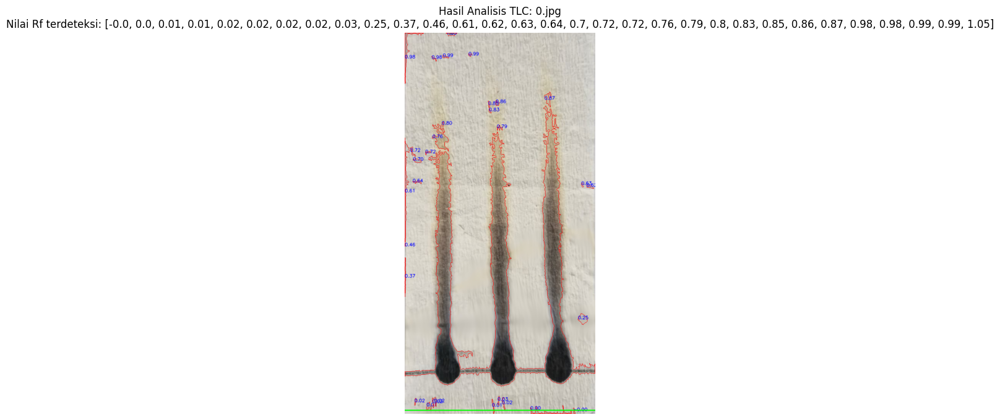

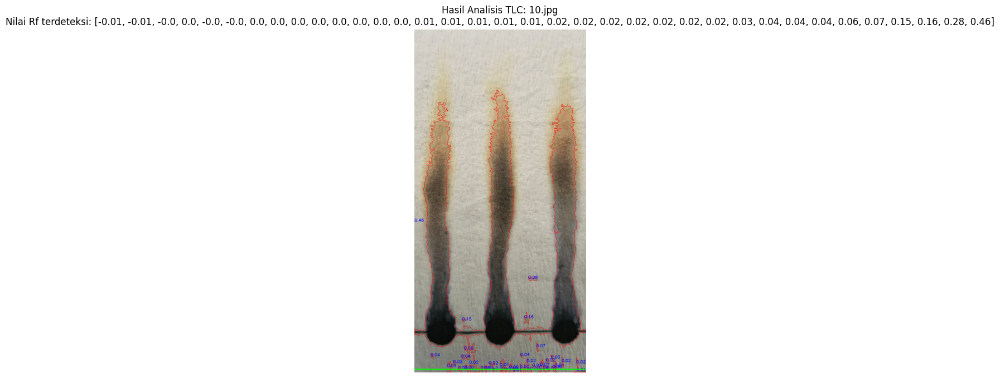

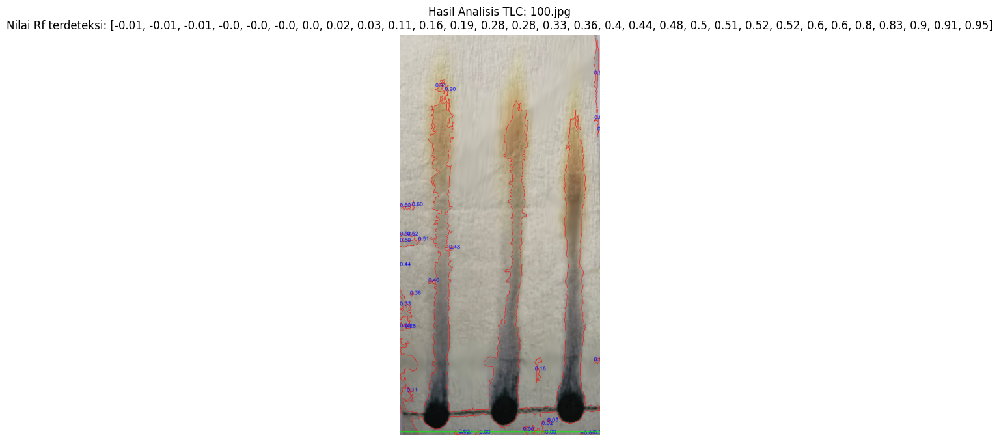

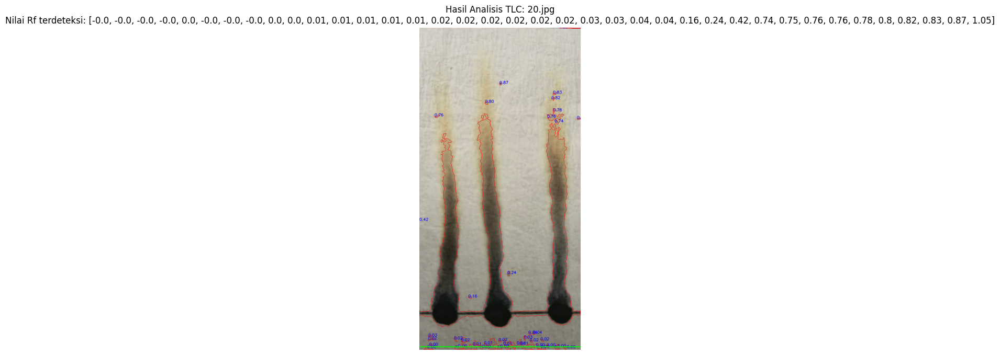

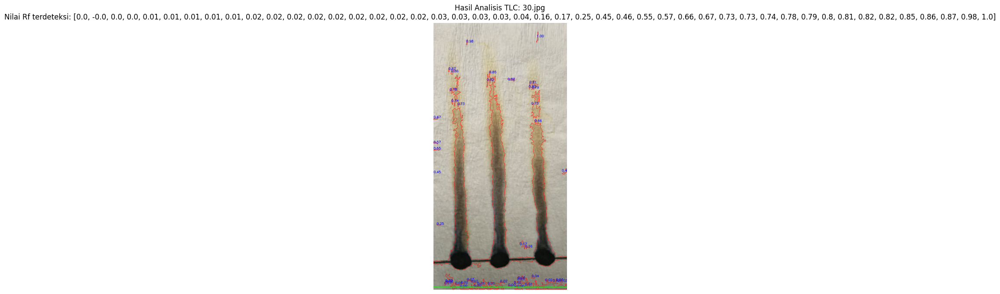

...

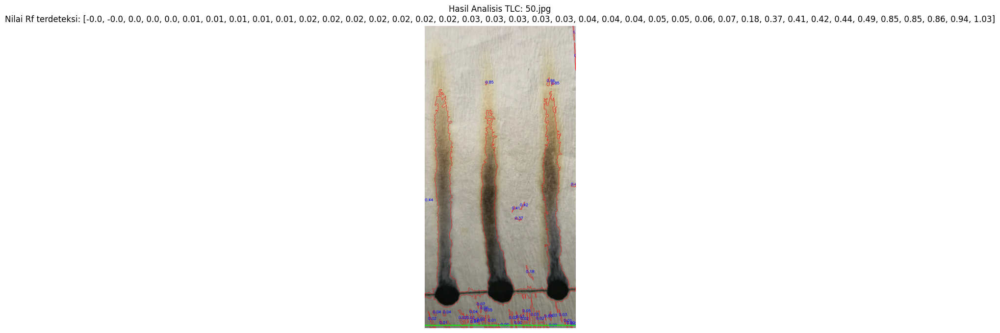

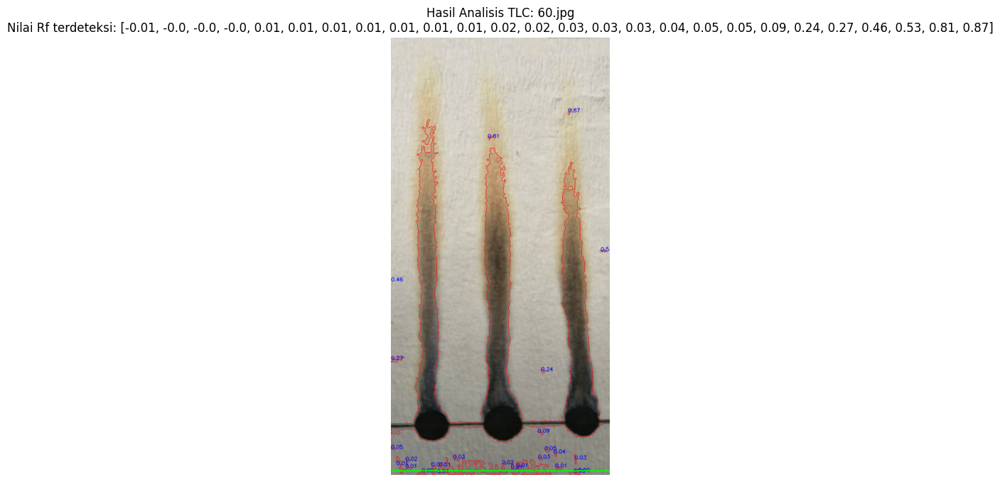

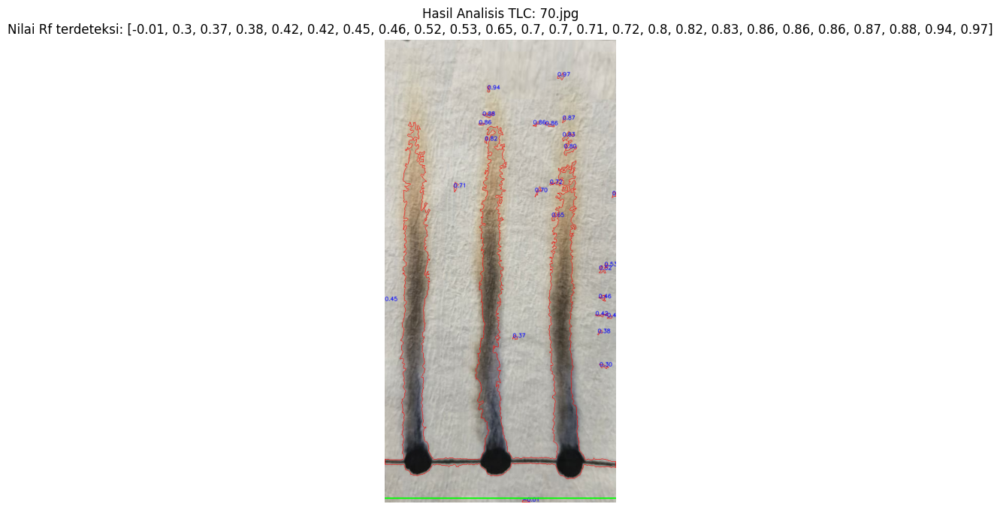

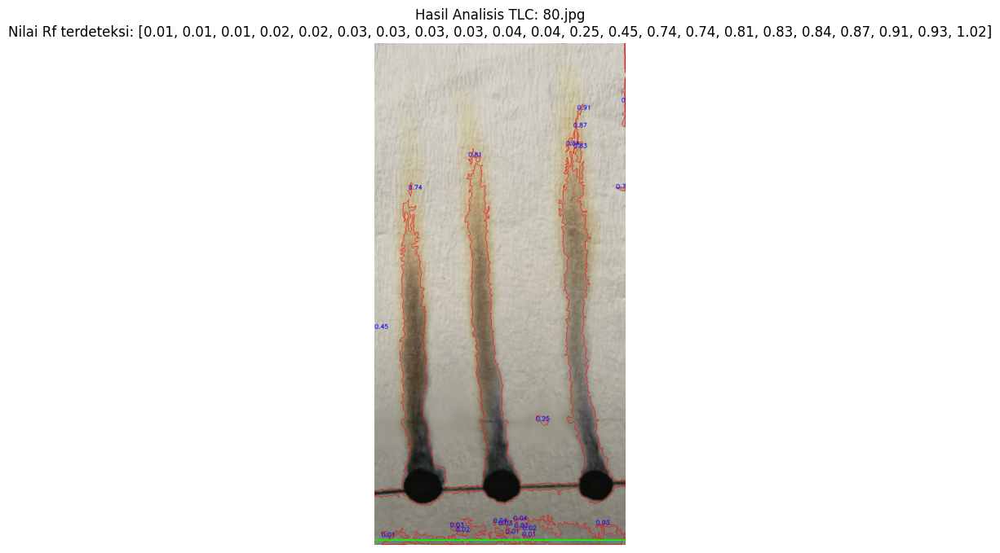

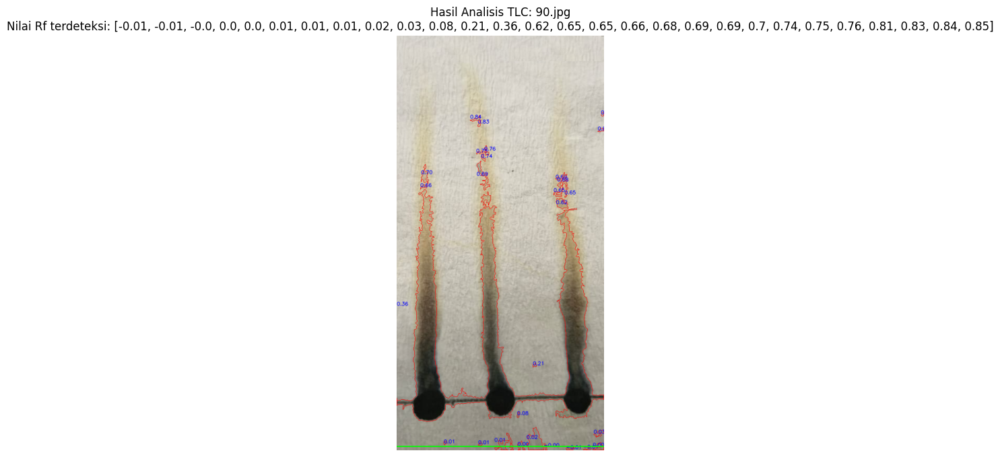

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# === KONFIGURASI DASAR ===
input_dir = "input"     # folder berisi gambar TLC (misal: 0.jpg, 30.jpg, 90.jpg)
output_dir = "output"   # folder untuk menyimpan hasil (opsional)
os.makedirs(output_dir, exist_ok=True)

# === PARAMETER VISUALISASI ===
img_size = (512, 1024)      # ubah sesuai proporsi plat TLC
min_contour_area = 40       # batas minimal spot (agar noise diabaikan)

# === FUNGSI PENGHITUNGAN RF ===
def calculate_rf(y_center, baseline_y, solvent_front_y):
    """Hitung nilai Rf: (jarak spot / jarak pelarut)"""
    return round((baseline_y - y_center) / (baseline_y - solvent_front_y), 2)

# === ANALISIS SETIAP GAMBAR ===
for filename in sorted(os.listdir(input_dir)):
    if not filename.lower().endswith(('.jpg', '.png', '.jpeg')):
        continue

    # --- 1. Baca & praproses gambar ---
    path = os.path.join(input_dir, filename)
    img = cv2.imread(path)
    img = cv2.resize(img, img_size)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (3,3), 0)

    # Kontras adaptif (CLAHE)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    enhanced = clahe.apply(blur)

    # --- 2. Thresholding & kontur ---
    _, thresh = cv2.threshold(enhanced, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # --- 3. Tentukan baseline & solvent front ---
    baseline_y = img.shape[0] - 10
    solvent_front_y = 50

    # --- 4. Gambar kontur + hitung Rf ---
    rf_values = []
    for c in contours:
        area = cv2.contourArea(c)
        if area < min_contour_area:
            continue

        x, y, w, h = cv2.boundingRect(c)
        center_y = y + h/2
        rf = calculate_rf(center_y, baseline_y, solvent_front_y)
        rf_values.append(rf)

        # Kontur merah
        cv2.drawContours(img, [c], -1, (0,0,255), 1)
        # Nilai Rf biru
        cv2.putText(img, f"{rf:.2f}", (x, int(center_y)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255,0,0), 1, cv2.LINE_AA)

    # Garis baseline hijau
    cv2.line(img, (0, baseline_y), (img.shape[1], baseline_y), (0,255,0), 2)

    # --- 5. Tampilkan hasil di output cell ---
    plt.figure(figsize=(4,8))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Hasil Analisis TLC: {filename}\nNilai Rf terdeteksi: {sorted(rf_values)}")
    plt.axis('off')
    plt.show()

# Task
Analyze images in the "/content/drive/MyDrive/bbmsmansa" directory, comparing each image to "lite.jpg" as a minimum control and "max.jpg" as a maximum control, using image preprocessing, augmentation, and lane spot analysis techniques, and explain the findings. If the detection is not accurate, provide guidance on how to improve it.

## Identifikasi parameter deteksi

### Subtask:
Fokus pada parameter dalam fungsi `analyze_lane_spots` yang memengaruhi deteksi noda, seperti nilai threshold dan ukuran kontur minimum.


**Reasoning**:
The subtask is to identify the parameters within the `analyze_lane_spots` function that control spot detection, specifically the threshold value and the minimum contour area. I need to review the code for this function to find these parameters.



In [ ]:
# Reviewing the analyze_lane_spots function code to identify relevant parameters.
# Thresholding is done with cv2.threshold.
# Contour filtering based on size is done with cv2.contourArea.

# The threshold value is the second argument in cv2.threshold.
# The minimum contour area is the value compared against the result of cv2.contourArea.

# The identified parameters are:
# 1. The threshold value in cv2.threshold
# 2. The minimum area threshold used to filter contours

## Eksplorasi nilai parameter

### Subtask:
Jelaskan bagaimana mengubah nilai-nilai parameter ini dapat memengaruhi deteksi (misalnya, threshold lebih rendah akan mendeteksi noda yang lebih samar, ukuran kontur minimum yang lebih kecil akan mendeteksi noda yang lebih kecil/noise).


**Reasoning**:
Provide a detailed explanation of how adjusting the threshold value and minimum contour area affects spot detection, following the subtask instructions.



In [ ]:
# 1. Explanation of the threshold value in cv2.threshold
print("Pengaruh nilai threshold dalam cv2.threshold:")
print("- Nilai threshold menentukan batas antara piksel yang dianggap sebagai noda (putih) dan latar belakang (hitam) setelah gambar di-invert.")
print("- Jika nilai threshold DITURUNKAN (misalnya dari 50 menjadi 30), piksel dengan intensitas yang sedikit lebih tinggi (setelah inversi) akan dianggap sebagai bagian dari noda.")
print("  Ini berarti noda yang lebih samar atau kurang kontras dengan latar belakang kemungkinan besar akan terdeteksi.")
print("- Jika nilai threshold DITAIKKAN (misalnya dari 50 menjadi 70), hanya piksel dengan intensitas yang jauh lebih tinggi (setelah inversi) yang akan dianggap sebagai bagian dari noda.")
print("  Ini akan membuat deteksi lebih ketat, hanya mendeteksi noda yang sangat jelas dan kontras, serta dapat menghilangkan noda yang samar atau bintik-bintik kecil.")

print("\n")

# 2. Explanation of the minimum contour area threshold
print("Pengaruh nilai minimum contour area:")
print("- Setelah binarisasi, cv2.findContours mendeteksi semua area putih yang terhubung (kontur).")
print("- Nilai minimum contour area (saat ini 20) digunakan untuk menyaring kontur yang terlalu kecil.")
print("- Jika nilai minimum contour area DITURUNKAN (misalnya dari 20 menjadi 5), kontur yang lebih kecil akan dipertahankan.")
print("  Ini akan memungkinkan deteksi noda yang berukuran lebih kecil, tetapi juga dapat menyebabkan deteksi bintik-bintik kecil atau noise sebagai noda.")
print("- Jika nilai minimum contour area DITAIKKAN (misalnya dari 20 menjadi 50), hanya kontur yang berukuran besar yang akan dipertahankan.")
print("  Ini akan secara efektif menyaring kontur-kontur kecil atau noise, tetapi berisiko mengabaikan noda asli yang berukuran kecil.")

print("\n")

# 3. Summary of adjusting both parameters
print("Ringkasan: Menyesuaikan sensitivitas deteksi noda:")
print("- Untuk membuat deteksi lebih SENSITIF (mendeteksi noda samar/kecil):")
print("  - TURUNKAN nilai threshold dalam cv2.threshold.")
print("  - TURUNKAN nilai minimum contour area.")
print("  Namun, kombinasi ini dapat meningkatkan kemungkinan mendeteksi noise sebagai noda.")
print("- Untuk membuat deteksi lebih TIDAK SENSITIF (menyaring noise):")
print("  - TAIKKAN nilai threshold dalam cv2.threshold.")
print("  - TAIKKAN nilai minimum contour area.")
print("  Namun, kombinasi ini dapat meningkatkan risiko mengabaikan noda asli yang samar atau kecil.")
print("Penyesuaian yang optimal biasanya memerlukan eksperimen dengan nilai yang berbeda pada citra sampel.")